In [2]:
# import all necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import math
import seaborn as sns

In [233]:
# import dataset
df = pd.read_csv("data/charging_sessions.csv")

# ----------data preparation routine----------
dfClusteringAll = df.copy().drop('Unnamed: 0', axis=1)

#dfClusteringAll['hasUserInputs'] = dfClusteringAll['userID'].notnull()
dfClusteringAll = dfClusteringAll.drop('userID', axis=1)
#dfClusteringAll = dfClusteringAll.drop('userInputs', axis=1)
dfClusteringAll = dfClusteringAll.drop('timezone', axis=1)
dfClusteringAll = dfClusteringAll.drop('spaceID', axis=1)
dfClusteringAll = dfClusteringAll.drop('id', axis=1)

# remove duplicate rows
dfClusteringAll = dfClusteringAll.drop_duplicates()
#print('Percentage of rows without doneChargingTime: ' + str((dfClusteringAll[dfClusteringAll['doneChargingTime'].isnull()].shape[0])/(dfClusteringAll.shape[0])))
#dfClusteringAll = dfClusteringAll[dfClusteringAll['doneChargingTime'].notna()]

# Convert to datetime
dfClusteringAll['connectionTime'] = pd.to_datetime(dfClusteringAll['connectionTime'], utc = True)
dfClusteringAll['disconnectTime'] = pd.to_datetime(dfClusteringAll['disconnectTime'], utc = True)
dfClusteringAll['doneChargingTime'] = pd.to_datetime(dfClusteringAll['doneChargingTime'])

dfClusteringAll['connectionHour'] = (dfClusteringAll['connectionTime']+pd.DateOffset(hours=1)).dt.hour
dfClusteringAll['disconnectHour'] = (dfClusteringAll['disconnectTime']+pd.DateOffset(hours=1)).dt.hour
dfClusteringAll['connectionMinute'] = (dfClusteringAll['connectionTime'].dt.hour*60)+dfClusteringAll['connectionTime'].dt.minute

dfClusteringAll['arrivalOnWeekday'] = dfClusteringAll['connectionTime'].dt.dayofweek < 5 

#Offen: beide features in minuten 
dfClusteringAll['serviceLifeTime'] = dfClusteringAll['disconnectTime']-dfClusteringAll['connectionTime']
dfClusteringAll['serviceLifeTime'] = dfClusteringAll['serviceLifeTime'].dt.total_seconds()/60
dfClusteringAll['blockingTime'] = dfClusteringAll['disconnectTime']-dfClusteringAll['doneChargingTime']
dfClusteringAll['blockingTime'] = dfClusteringAll['blockingTime'].dt.total_seconds()/60
dfClusteringAll['blockingTime'] = dfClusteringAll['blockingTime']/dfClusteringAll['serviceLifeTime']


#Wenn connectionTime nach 0 Uhr UND vor 14 Uhr UND Standzeit weniger als ein Tag UND connectionTime+Standzeit vor 15 Uhr
dfClusteringAll['arrivalDuringRushHour'] = (dfClusteringAll['connectionHour'] >= 15) | (dfClusteringAll['connectionHour'] == 0)
dfClusteringAll['departureDuringRushHour'] = (dfClusteringAll['disconnectHour'] >= 15) | (dfClusteringAll['disconnectHour'] == 0)
dfClusteringAll['arrivalBeforeNoon'] = dfClusteringAll['connectionHour'] <= 12


In [150]:
def adjustBlockingTime(entry):
    
    if entry >= 1:
        return 1
    elif entry <= 0:
        return 0
    else:
        return entry

#Transform datetime values in dictionary to dateTime
dfClusteringAll['blockingTime'] = dfClusteringAll['blockingTime'].apply(adjustBlockingTime)


In [97]:
dfClusteringAll = dfClusteringAll[dfClusteringAll['userInputs'].notnull()]

def userInputStringToDictionary(entry):
    
    s = entry.replace("\'", "\"").replace("True", "1").replace("False","0")
    return json.loads(s)[0]

#cast of time variables
def transformDictionaryForTimeComparison(entry):
    
    entry['minutesAvailable'] = int(entry['minutesAvailable'])
    return entry

#return 'requestedDeparture' value from dictionary 'userInputs'
def returnWhPerMile(entry):
    
    return entry['WhPerMile']

#return 'requestedDeparture' value from dictionary 'userInputs'
def returnKwhRequested(entry):
    
    return entry['kWhRequested']

#return 'requestedDeparture' value from dictionary 'userInputs'
def returnMinutesAvailable(entry):
    
    return entry['minutesAvailable']

#Transform 'userInputs' into dictionary type
dfClusteringAll['userInputs'] = dfClusteringAll[~dfClusteringAll['userInputs'].isna()]['userInputs'].apply(userInputStringToDictionary)

#Transform datetime values in dictionary to dateTime
dfClusteringAll['userInputs'] = dfClusteringAll[~dfClusteringAll['userInputs'].isna()]['userInputs'].apply(transformDictionaryForTimeComparison)

#Create Column for some 'userInput' (dictionary) values
dfClusteringAll['WhPerMile'] = dfClusteringAll[~dfClusteringAll['userInputs'].isna()]['userInputs'].apply(returnWhPerMile)
dfClusteringAll['kWhRequested'] = dfClusteringAll[~dfClusteringAll['userInputs'].isna()]['userInputs'].apply(returnKwhRequested)
dfClusteringAll['minutesAvailable']  = dfClusteringAll[~dfClusteringAll['userInputs'].isna()]['userInputs'].apply(returnMinutesAvailable)




In [100]:
dfPairs = dfClusteringAll.copy()
dfPairs = dfPairs.drop('connectionTime',axis=1)
dfPairs = dfPairs.drop('disconnectTime',axis=1)
dfPairs = dfPairs.drop('doneChargingTime',axis=1)
dfPairs = dfPairs.drop('sessionID',axis=1)
dfPairs = dfPairs.drop('stationID',axis=1)
dfPairs = dfPairs.drop('userInputs',axis=1)
dfPairs = dfPairs.drop('connectionHour',axis=1)
dfPairs = dfPairs.drop('disconnectHour',axis=1)
dfPairs = dfPairs.drop('connectionMinute',axis=1)
dfPairs = dfPairs.drop('blockingTime',axis=1)
dfPairs = dfPairs.drop('arrivalDuringRushHour',axis=1)
dfPairs = dfPairs.drop('departureDuringRushHour',axis=1)
dfPairs = dfPairs.drop('arrivalBeforeNoon',axis=1)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_stats\counting.py:137: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bin_edges = np.histogram_bin_edges(vals, bins, binrange, weight)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_stats\counting.py:176: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist, edges = np.histogram(vals, **bin_kws, weights=weights, density=density)


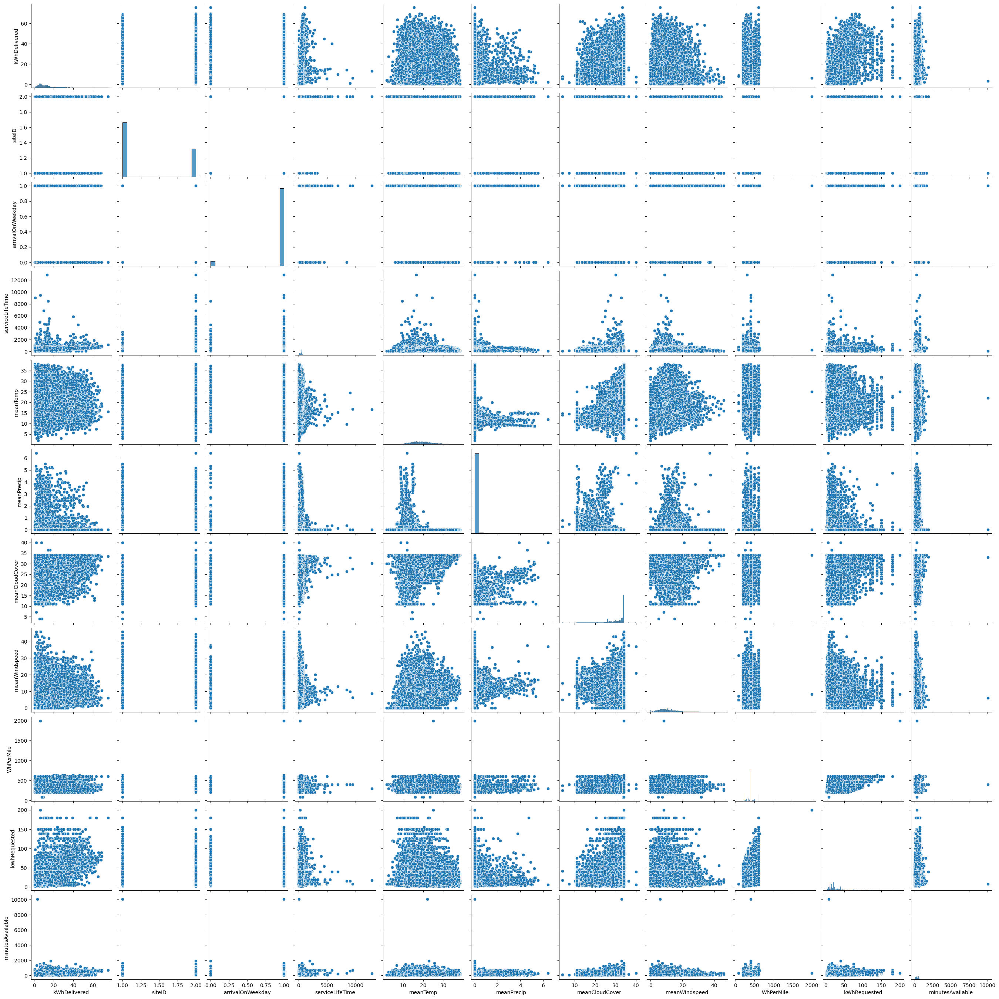

In [102]:
sns.pairplot(data=dfPairs)

### To Do: Look again at samples with userInputs at the 3 above specified features

In [77]:
dfClusteringAll.head()

,connectionTime,disconnectTime,doneChargingTime,kWhDelivered,sessionID,siteID,stationID,userInputs,connectionHour,disconnectHour,...,arrivalOnWeekday,serviceLifeTime,blockingTime,arrivalDuringRushHour,departureDuringRushHour,arrivalBeforeNoon,meanTemp,meanPrecip,meanCloudCover,meanWindspeed
0,2020-01-02 13:08:54+00:00,2020-01-02 19:11:15+00:00,2020-01-02 17:31:35+00:00,25.016,1_1_179_810_2020-01-02 13:08:53.870034,1,1-1-179-810,"[{'WhPerMile': 250, 'kWhRequested': 25.0, 'mil...",14,20,...,True,362.350000,0.275056,False,True,False,14.166667,0.0,33.833333,14.166667
1,2020-01-02 13:36:50+00:00,2020-01-02 22:38:21+00:00,2020-01-02 20:18:05+00:00,33.097,1_1_193_825_2020-01-02 13:36:49.599853,1,1-1-193-825,"[{'WhPerMile': 280, 'kWhRequested': 70.0, 'mil...",14,23,...,True,541.516667,0.259026,False,True,False,15.777778,0.0,33.888889,10.444444
2,2020-01-02 13:56:35+00:00,2020-01-03 00:39:22+00:00,2020-01-02 16:35:06+00:00,6.521,1_1_193_829_2020-01-02 13:56:35.214993,1,1-1-193-829,"[{'WhPerMile': 400, 'kWhRequested': 8.0, 'mile...",14,1,...,True,642.783333,0.753390,False,False,False,16.400000,0.0,34.000000,9.900000
3,2020-01-02 13:59:58+00:00,2020-01-02 16:38:39+00:00,2020-01-02 15:18:45+00:00,2.355,1_1_193_820_2020-01-02 13:59:58.309319,1,1-1-193-820,"[{'WhPerMile': 400, 'kWhRequested': 8.0, 'mile...",14,17,...,True,158.683333,0.503519,False,True,False,15.000000,0.0,34.000000,17.500000
4,2020-01-02 14:00:01+00:00,2020-01-02 22:08:40+00:00,2020-01-02 18:17:30+00:00,13.375,1_1_193_819_2020-01-02 14:00:00.779967,1,1-1-193-819,"[{'WhPerMile': 400, 'kWhRequested': 16.0, 'mil...",15,23,...,True,488.650000,0.473072,True,True,False,16.125000,0.0,34.000000,9.625000


### Features: kWhDelivered, serviceLifeTime, WhPerMile, kWhRequested, minutesAvailable

In [259]:
def plot_relationships(feature1, feature2, lowerX, upperX, lowerY, upperY):
    
    #color = np.where((dfClusteringAll['siteID']), 'green', 'red')
    #plt.scatter(dfClusteringAll[feature1], dfClusteringAll[feature2], c=color) #, c=color
    #plt.xlim(lowerX,upperX)
    #plt.ylim(lowerY,upperY)
    #plt.show()
    
    color = np.where((dfClusteringAll['arrivalOnWeekday']), 'green', 'red')
    plt.scatter(dfClusteringAll[feature1], dfClusteringAll[feature2], c=color) #, c=color
    plt.xlim(lowerX,upperX)
    plt.ylim(lowerY,upperY)
    plt.show()
    
    #color = np.where((dfClusteringAll['siteID']), 'green', 'red')
    #plt.scatter(dfClusteringAll[feature1], dfClusteringAll[feature2], c=color) #, c=color
    #plt.xlim(lowerX,upperX)
    #plt.ylim(lowerY,upperY)
    #plt.show()
    
    color = np.where((dfClusteringAll[dfClusteringAll['siteID']==2]['siteID']), 'green', 'red')#was arrivalDuringRushHour
    plt.scatter(dfClusteringAll[dfClusteringAll['siteID']==2][feature1], dfClusteringAll[dfClusteringAll['siteID']==2][feature2], c=color) #, c=color
    plt.xlim(lowerX,upperX)
    plt.ylim(lowerY,upperY)
    plt.show()

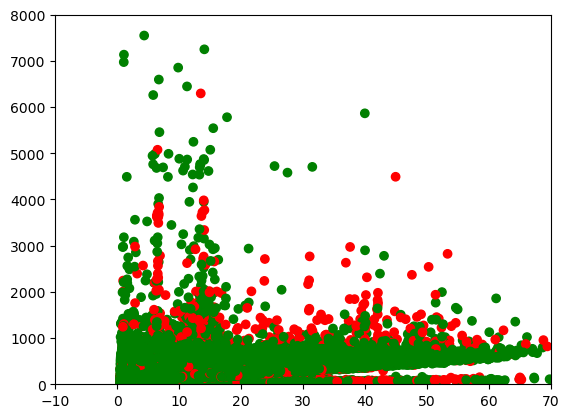

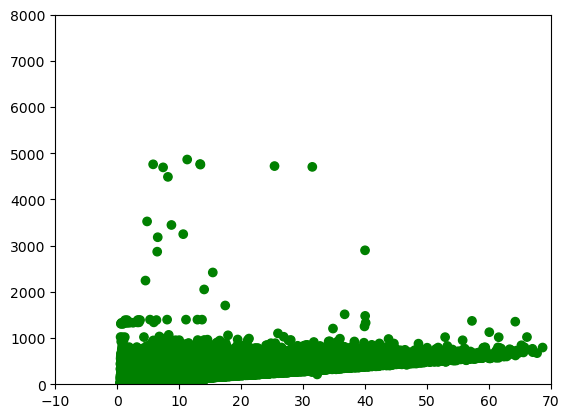

In [258]:
#siteID 1
plot_relationships('kWhDelivered','serviceLifeTime',-10,70,-1,8000)

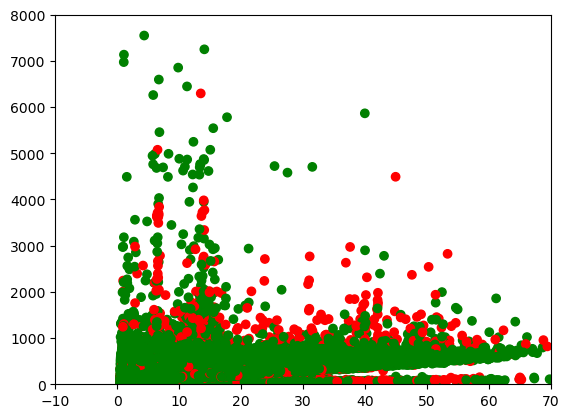

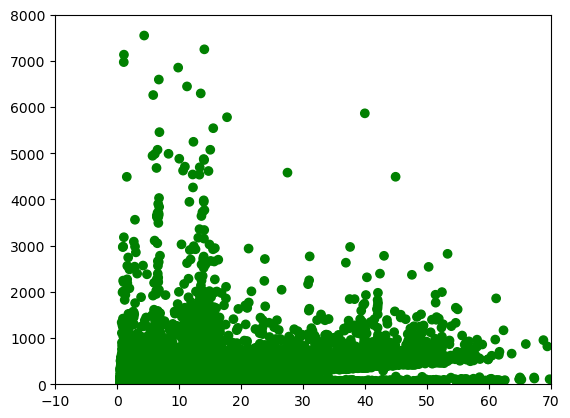

In [260]:
#siteID 2
plot_relationships('kWhDelivered','serviceLifeTime',-10,70,-1,8000)

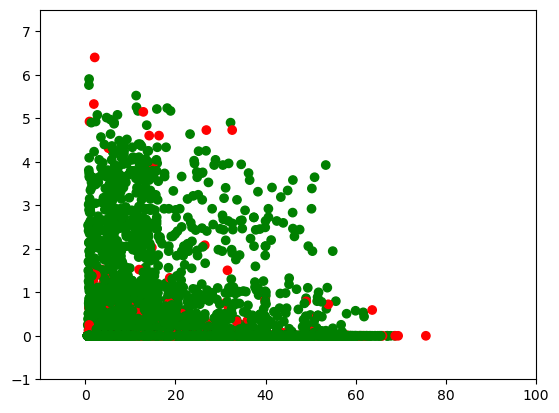

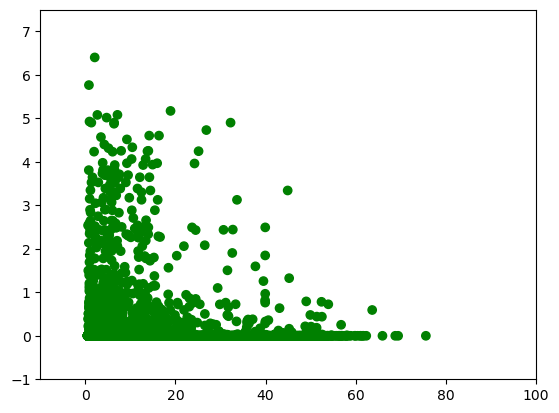

In [229]:
plot_relationships('kWhDelivered','meanPrecip',-10,100,-1,7.5)

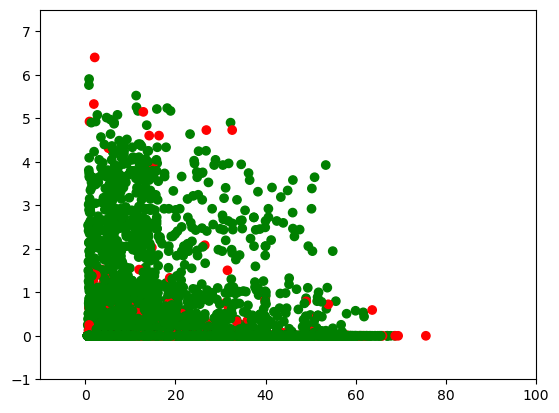

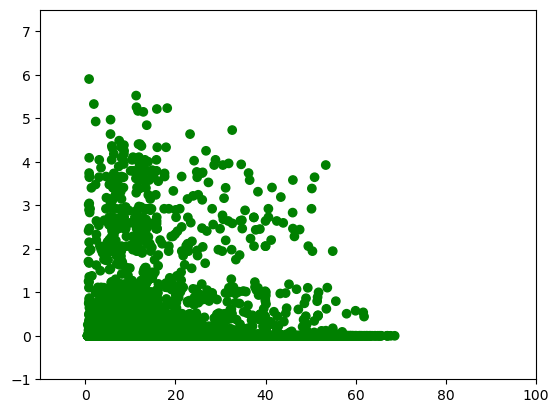

In [227]:
plot_relationships('kWhDelivered','meanPrecip',-10,100,-1,7.5)

#### minutesAvailable

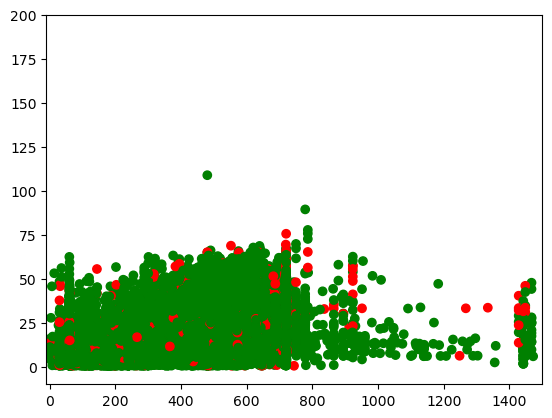

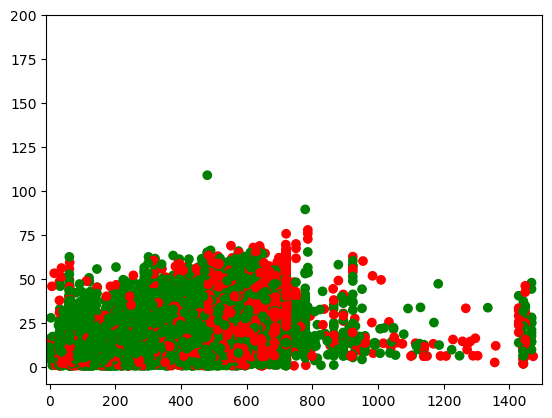

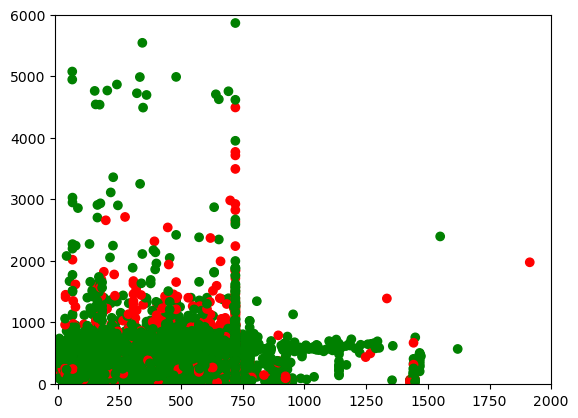

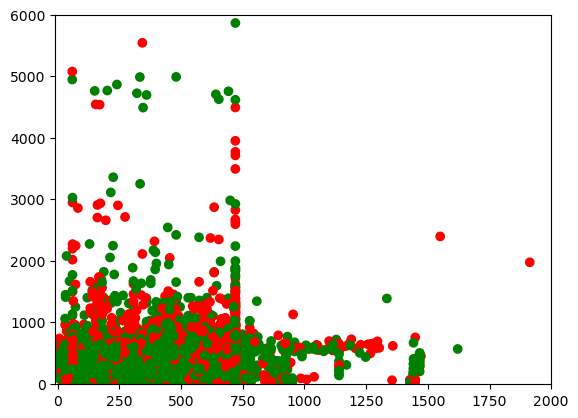

In [66]:
plot_relationships('minutesAvailable','kWhDelivered',-10,1500,-10,200)
plot_relationships('minutesAvailable','serviceLifeTime',-10,2000,-10,6000)

#### kWhRequested

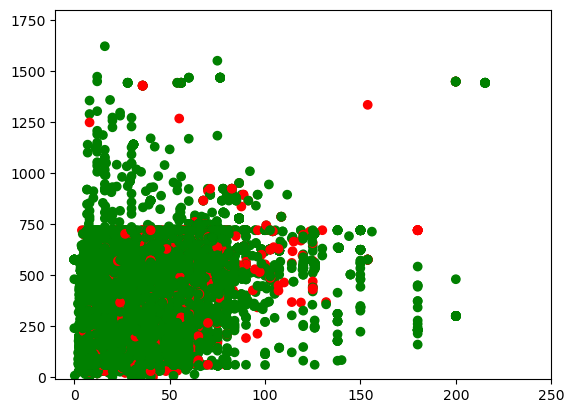

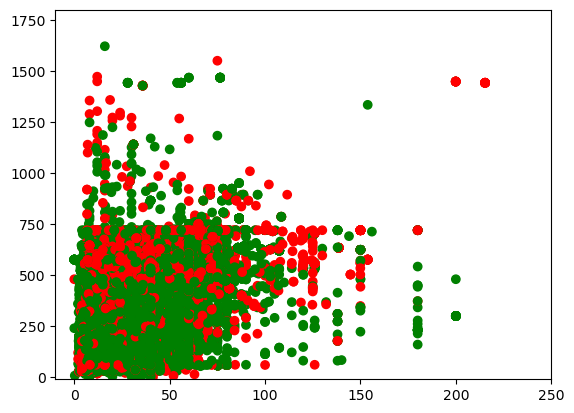

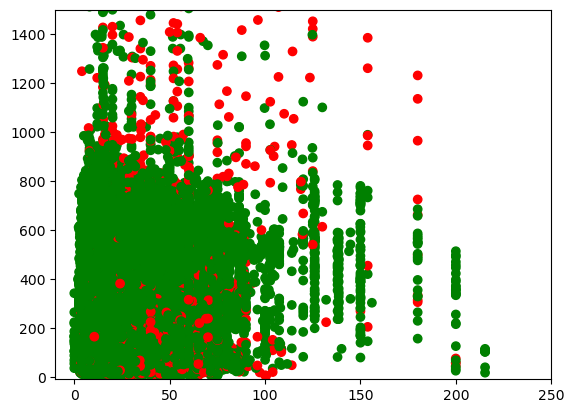

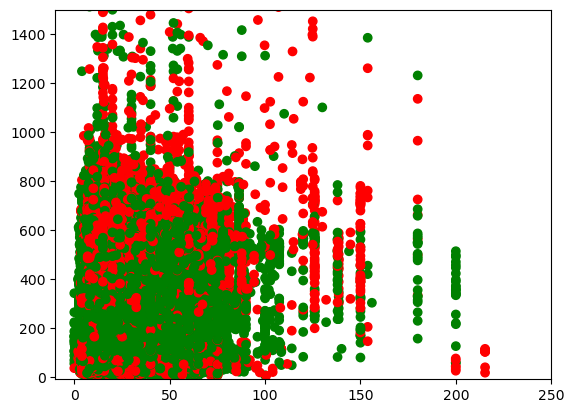

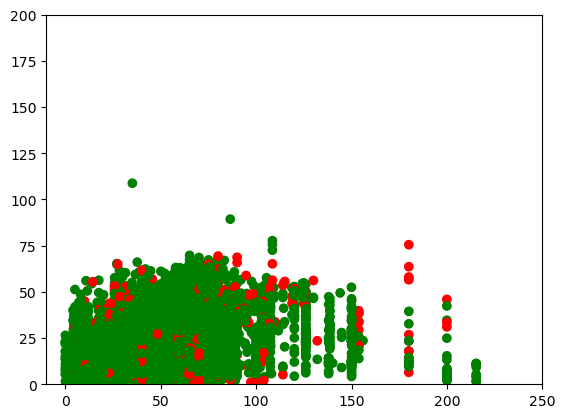

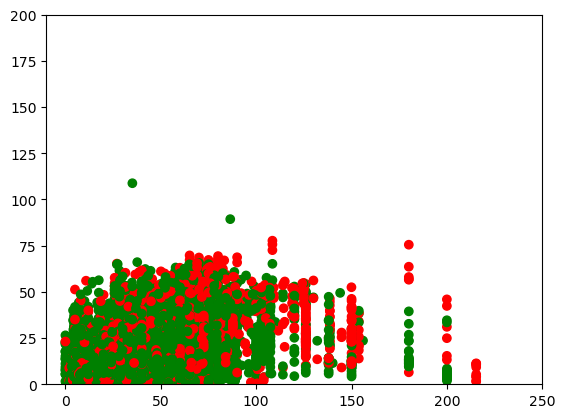

In [67]:
plot_relationships('kWhRequested','minutesAvailable',-10,250,-10,1800)
plot_relationships('kWhRequested','serviceLifeTime',-10,250,-10,1500)
plot_relationships('kWhRequested','kWhDelivered',-10,250,0,200)

#### WhPerMile:

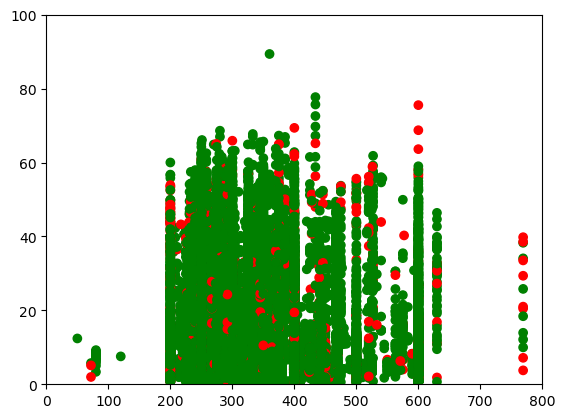

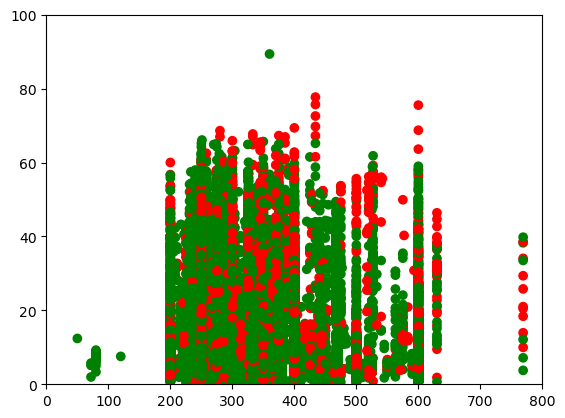

In [73]:
plot_relationships('WhPerMile','kWhDelivered',0,800,0,100)

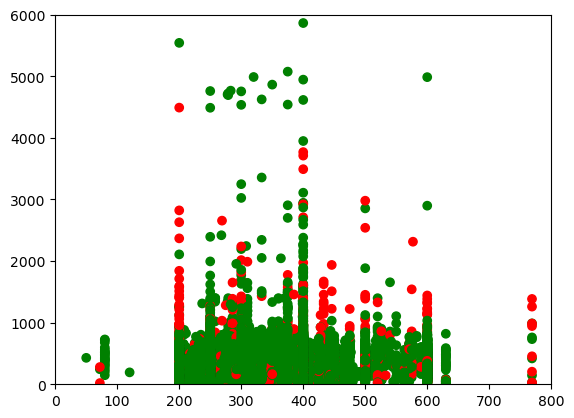

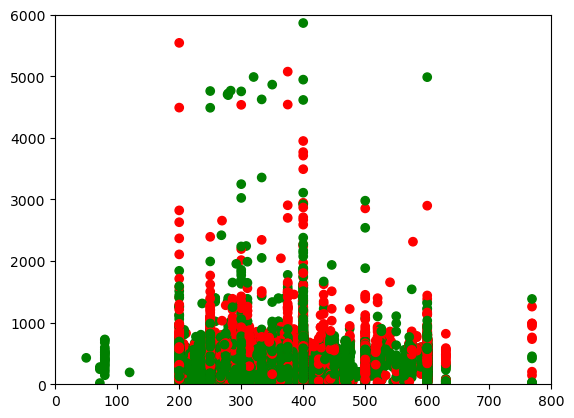

In [72]:
plot_relationships('WhPerMile','serviceLifeTime',0,800,0,6000)

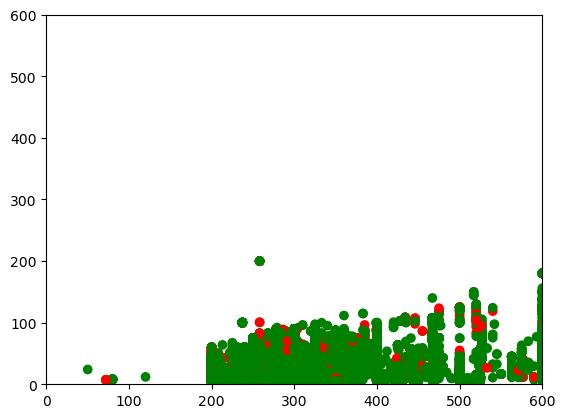

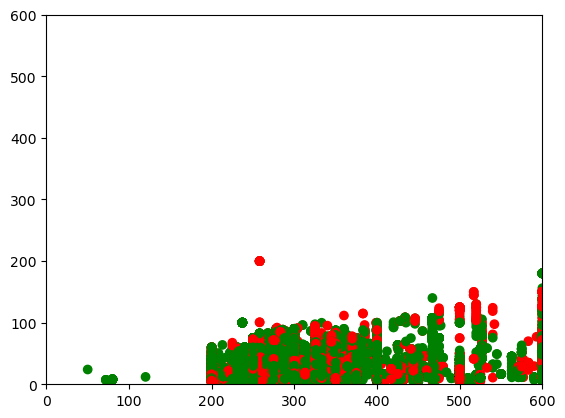

In [70]:
plot_relationships('WhPerMile','kWhRequested',0,600,0,600)

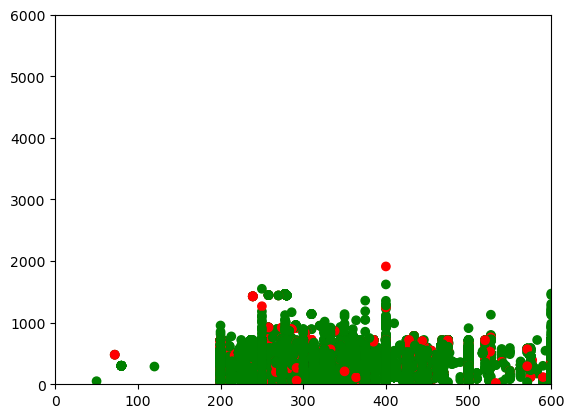

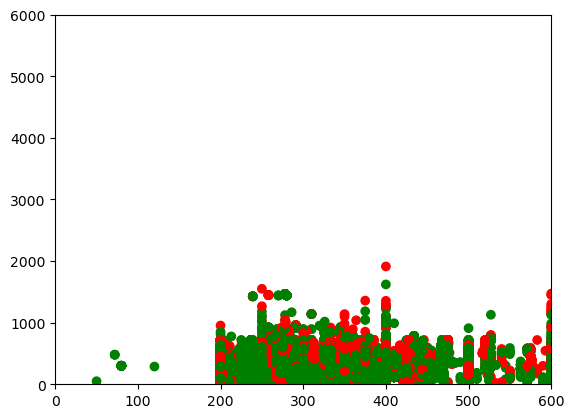

In [71]:
plot_relationships('WhPerMile','minutesAvailable',0,600,0,6000)

#### kWhDelivered - serviceLifeTime

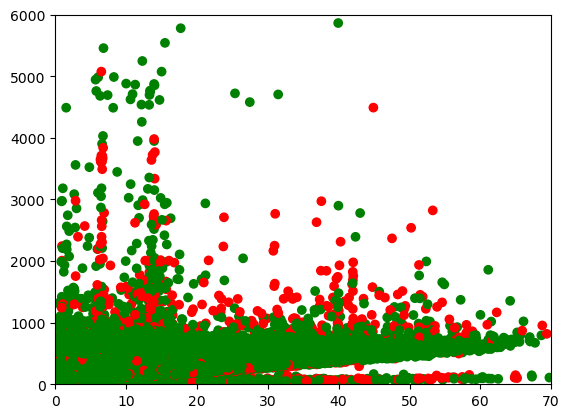

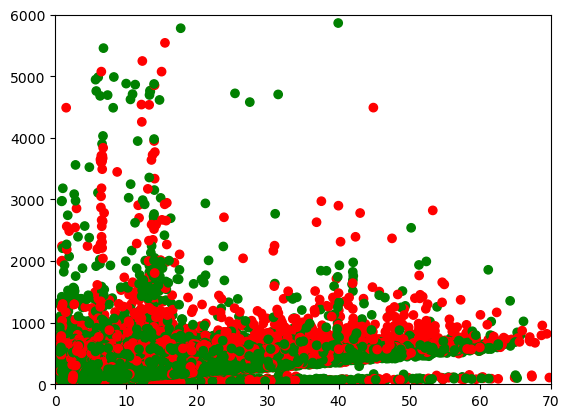

In [62]:
plot_relationships('kWhDelivered','serviceLifeTime',0,70,0,6000)

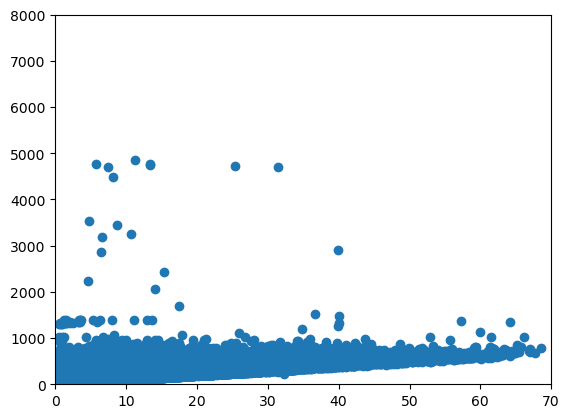

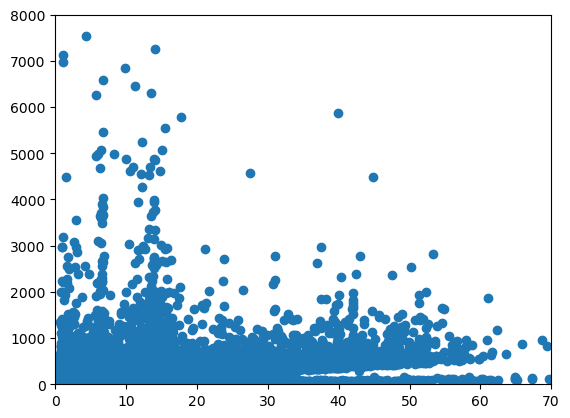

In [227]:
for i in range(1,3):
    #color = np.where((dfClusteringAll['siteID']), 'green', 'red')
    plt.scatter(dfClusteringAll[dfClusteringAll['siteID'] == i]['kWhDelivered'], dfClusteringAll[dfClusteringAll['siteID'] == i]['serviceLifeTime'])#, c=color) #, c=color
    plt.xlim(0,70)
    plt.ylim(0,8000)
    plt.show()

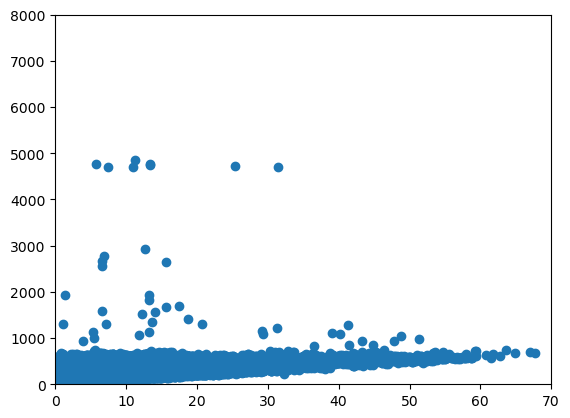

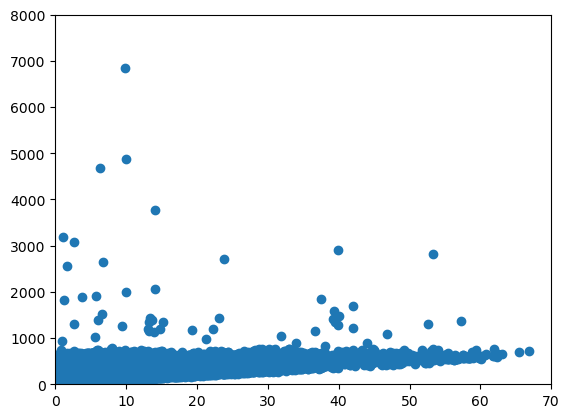

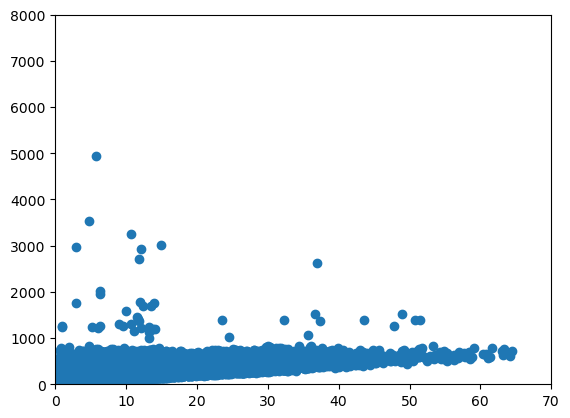

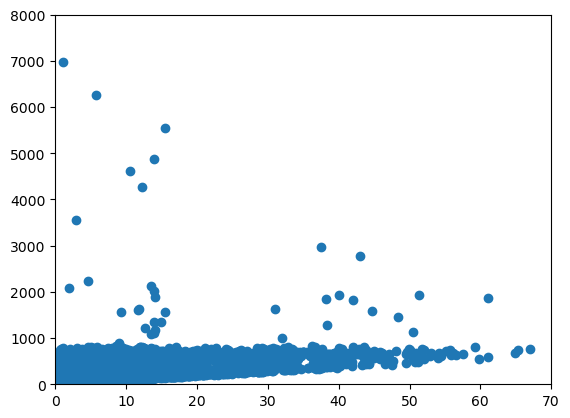

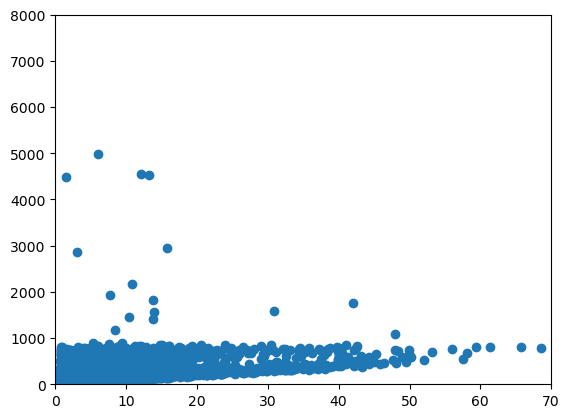

...

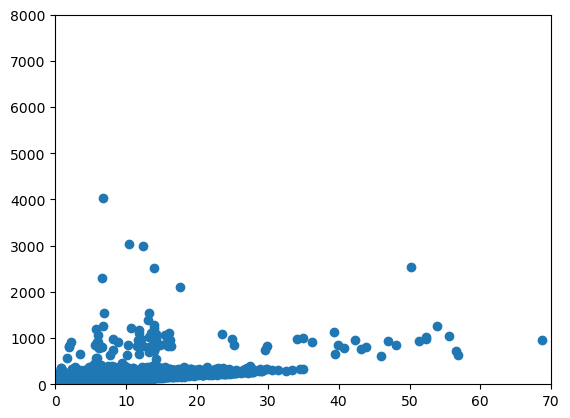

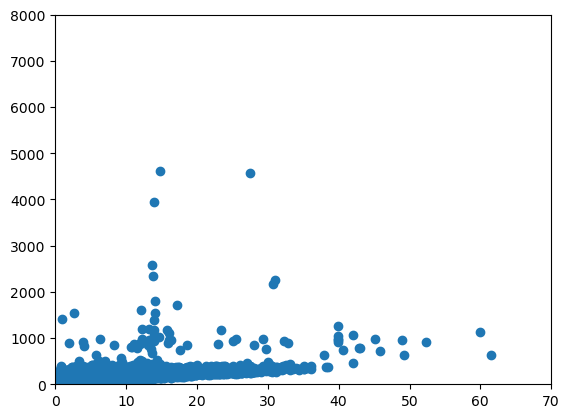

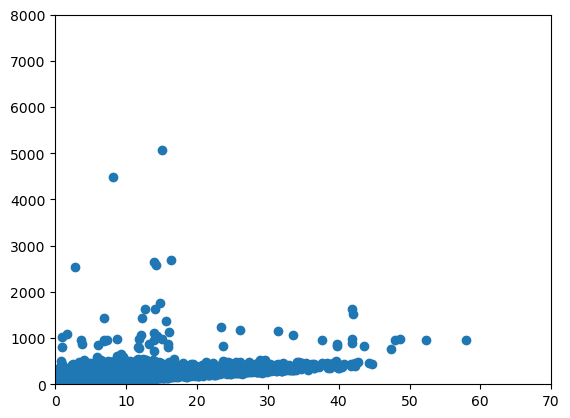

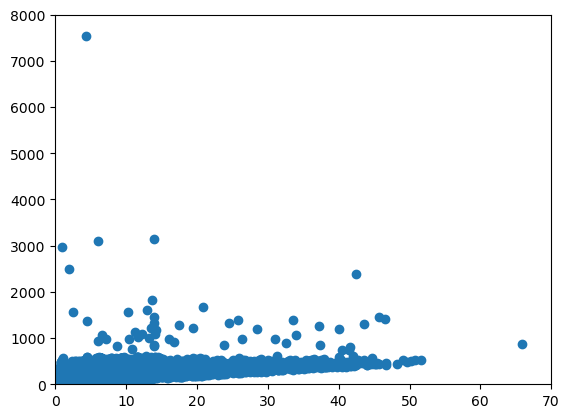

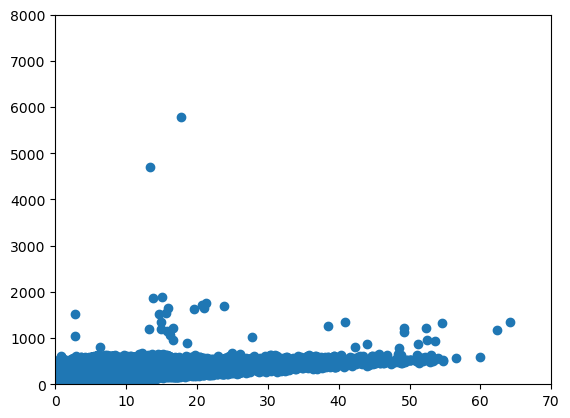

In [219]:
for i in range(0,24):
    #color = np.where((dfClusteringAll['siteID']), 'green', 'red')
    plt.scatter(dfClusteringAll[dfClusteringAll['disconnectHour'] == i]['kWhDelivered'], dfClusteringAll[dfClusteringAll['disconnectHour'] == i]['serviceLifeTime'])#, c=color) #, c=color
    plt.xlim(0,70)
    plt.ylim(0,8000)
    plt.show()

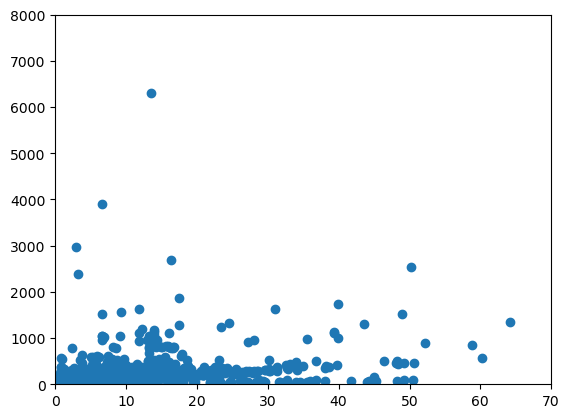

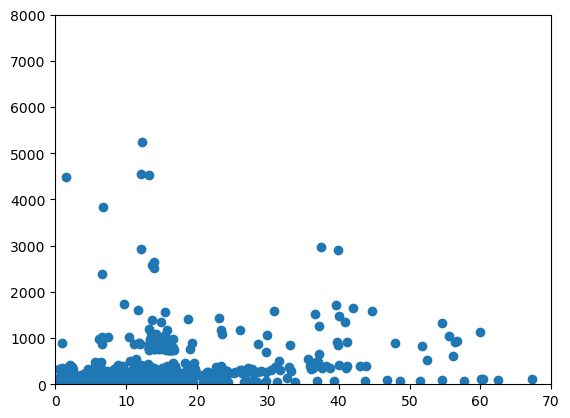

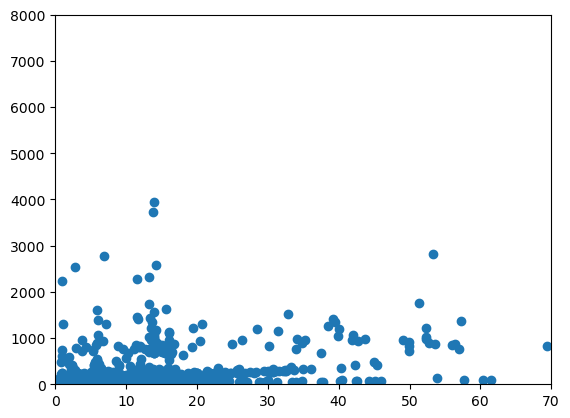

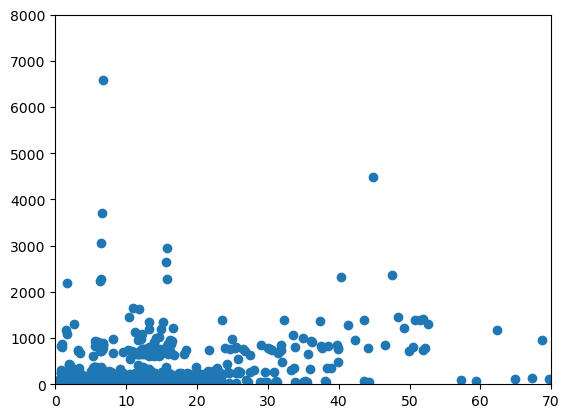

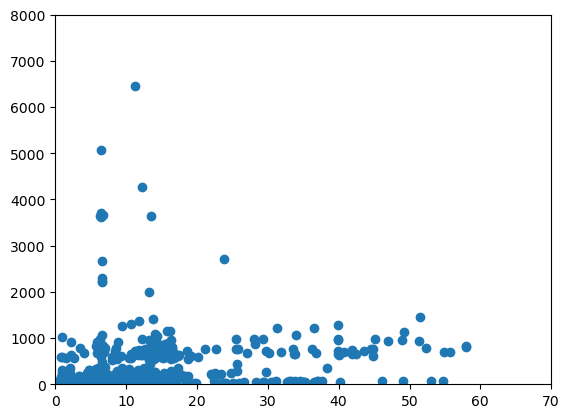

...

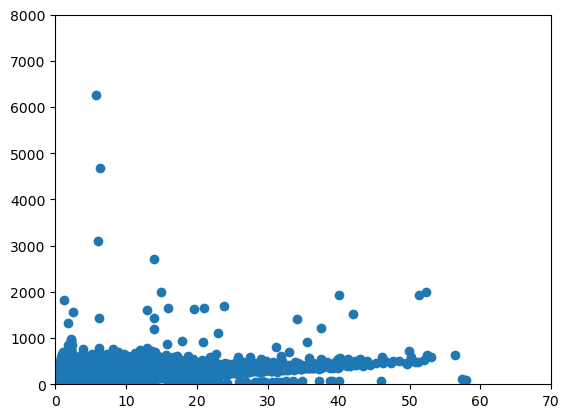

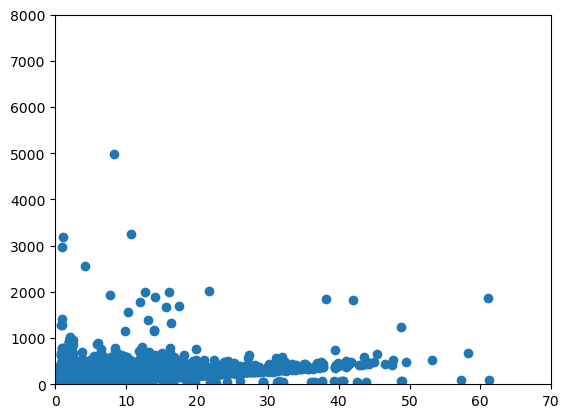

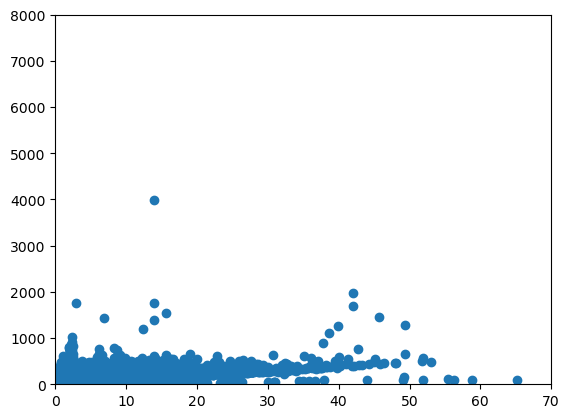

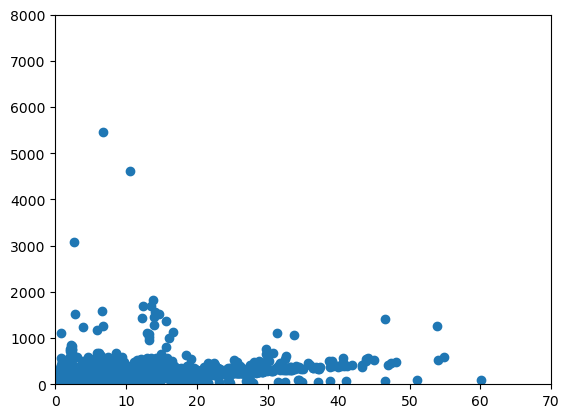

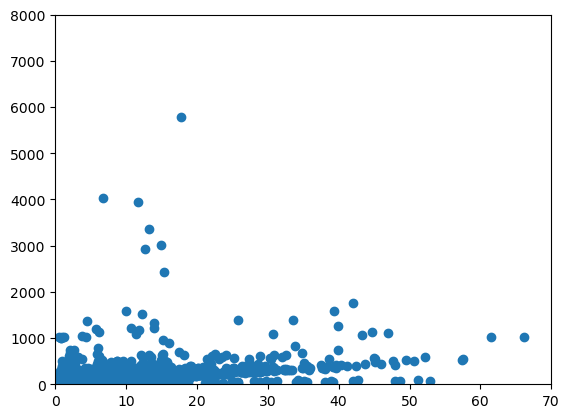

In [229]:
for i in range(0,24):
    #color = np.where((dfClusteringAll['siteID']), 'green', 'red')
    plt.scatter(dfClusteringAll[dfClusteringAll['connectionHour'] == i]['kWhDelivered'], dfClusteringAll[dfClusteringAll['connectionHour'] == i]['serviceLifeTime'])#, c=color) #, c=color
    plt.xlim(0,70)
    plt.ylim(0,8000)
    plt.show()

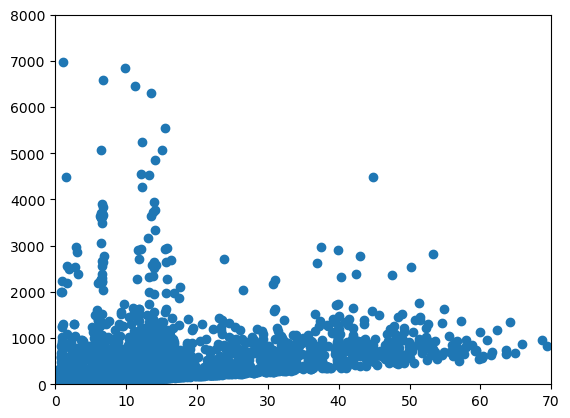

In [215]:
#color = np.where((dfClusteringAll['siteID']), 'green', 'red')
plt.scatter(dfClusteringAll[dfClusteringAll['arrivalBeforeNoon']]['kWhDelivered'], dfClusteringAll[dfClusteringAll['arrivalBeforeNoon']]['serviceLifeTime'])#, c=color) #, c=color
plt.xlim(0,70)
plt.ylim(0,8000)
plt.show()

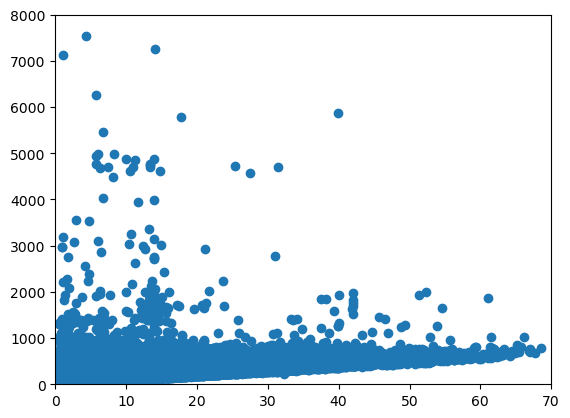

In [216]:
#color = np.where((dfClusteringAll['siteID']), 'green', 'red')
plt.scatter(dfClusteringAll[dfClusteringAll['arrivalBeforeNoon'] == False]['kWhDelivered'], dfClusteringAll[dfClusteringAll['arrivalBeforeNoon'] == False]['serviceLifeTime'])#, c=color) #, c=color
plt.xlim(0,70)
plt.ylim(0,8000)
plt.show()

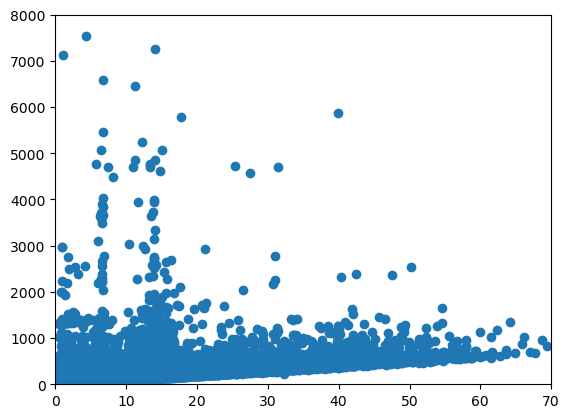

In [211]:
#color = np.where((dfClusteringAll['siteID']), 'green', 'red')
plt.scatter(dfClusteringAll[dfClusteringAll['departureDuringRushHour']]['kWhDelivered'], dfClusteringAll[dfClusteringAll['departureDuringRushHour']]['serviceLifeTime'])#, c=color) #, c=color
plt.xlim(0,70)
plt.ylim(0,8000)
plt.show()

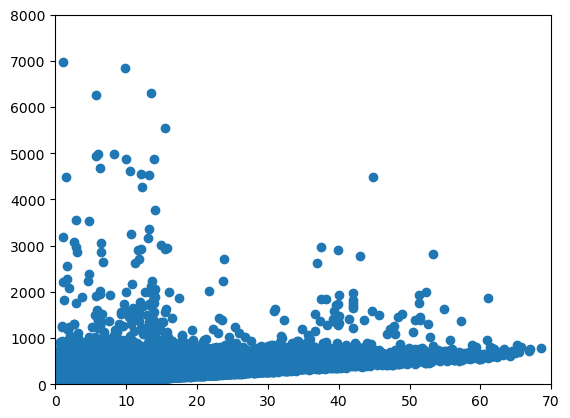

In [212]:
#color = np.where((dfClusteringAll['siteID']), 'green', 'red')
plt.scatter(dfClusteringAll[dfClusteringAll['departureDuringRushHour'] == False]['kWhDelivered'], dfClusteringAll[dfClusteringAll['departureDuringRushHour'] == False]['serviceLifeTime'])#, c=color) #, c=color
plt.xlim(0,70)
plt.ylim(0,8000)
plt.show()

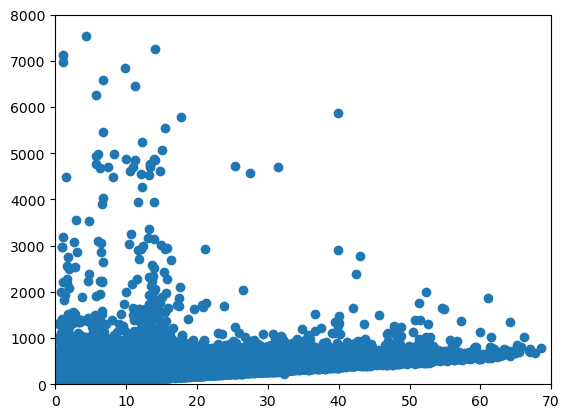

In [207]:
#color = np.where((dfClusteringAll['siteID']), 'green', 'red')
plt.scatter(dfClusteringAll[dfClusteringAll['arrivalOnWeekday']]['kWhDelivered'], dfClusteringAll[dfClusteringAll['arrivalOnWeekday']]['serviceLifeTime'])#, c=color) #, c=color
plt.xlim(0,70)
plt.ylim(0,8000)
plt.show()

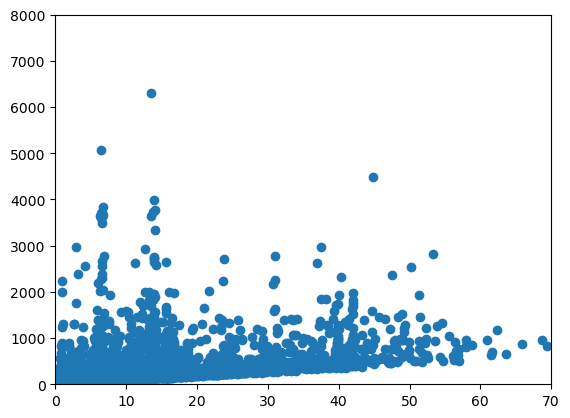

In [208]:
#color = np.where((dfClusteringAll['siteID']), 'green', 'red')
plt.scatter(dfClusteringAll[dfClusteringAll['arrivalOnWeekday'] == False]['kWhDelivered'], dfClusteringAll[dfClusteringAll['arrivalOnWeekday'] == False]['serviceLifeTime'])#, c=color) #, c=color
plt.xlim(0,70)
plt.ylim(0,8000)
plt.show()

(0.0, 1500.0)

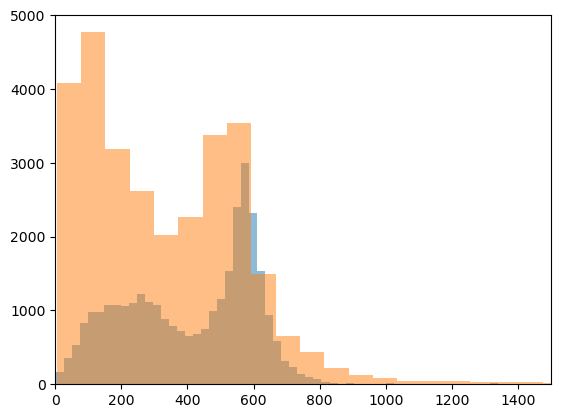

In [53]:
kwargs = dict(histtype='stepfilled', alpha=0.5, bins=200)

plt.hist(dfClusteringAll[dfClusteringAll['siteID'] == 1]['serviceLifeTime'], **kwargs)
plt.hist(dfClusteringAll[dfClusteringAll['siteID'] == 2]['serviceLifeTime'], **kwargs)
plt.xlim([0,1500])

(0.0, 800.0)

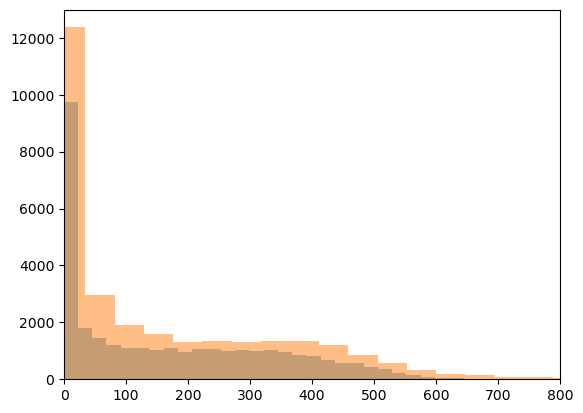

In [59]:
kwargs = dict(histtype='stepfilled', alpha=0.5, bins=200)

plt.hist(dfClusteringAll[dfClusteringAll['siteID'] == 1]['blockingTime'], **kwargs)
plt.hist(dfClusteringAll[dfClusteringAll['siteID'] == 2]['blockingTime'], **kwargs)
plt.xlim([0,800])

(0.0, 70.0)

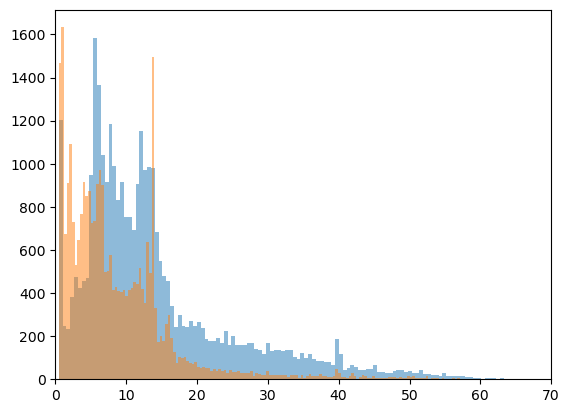

In [62]:
kwargs = dict(histtype='stepfilled', alpha=0.5, bins=200)

plt.hist(dfClusteringAll[dfClusteringAll['siteID'] == 1]['kWhDelivered'], **kwargs)
plt.hist(dfClusteringAll[dfClusteringAll['siteID'] == 2]['kWhDelivered'], **kwargs)
plt.xlim([0,70])

(0.0, 1500.0)

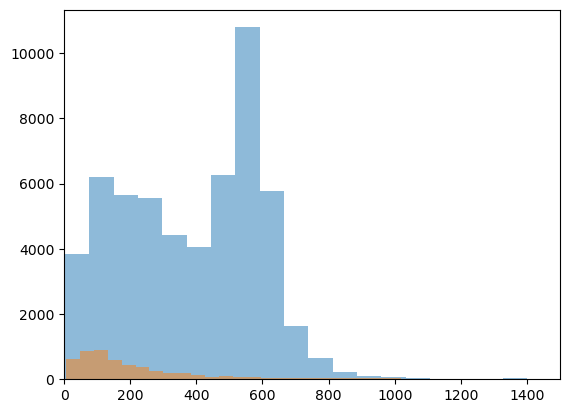

In [4]:
kwargs = dict(histtype='stepfilled', alpha=0.5, bins=200)

plt.hist(dfClusteringAll[dfClusteringAll['arrivalOnWeekday'] == True]['serviceLifeTime'], **kwargs)
plt.hist(dfClusteringAll[dfClusteringAll['arrivalOnWeekday'] == False]['serviceLifeTime'], **kwargs)
plt.xlim([0,1500])

(0.0, 750.0)

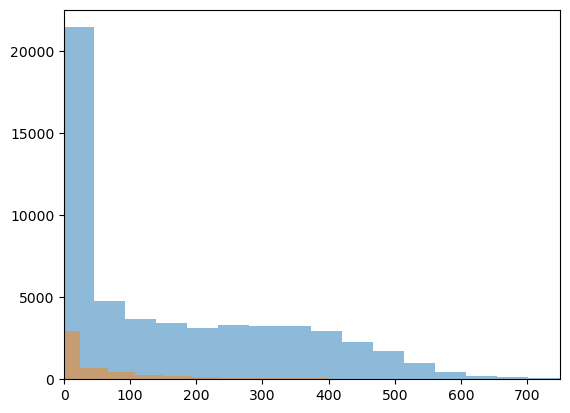

In [80]:
kwargs = dict(histtype='stepfilled', alpha=0.5, bins=200)

plt.hist(dfClusteringAll[dfClusteringAll['arrivalOnWeekday'] == True]['blockingTime'], **kwargs)
plt.hist(dfClusteringAll[dfClusteringAll['arrivalOnWeekday'] == False]['blockingTime'], **kwargs)
plt.xlim([0,750])

(0.0, 60.0)

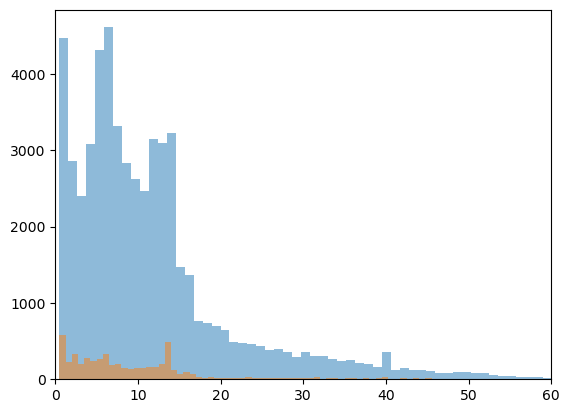

In [89]:
kwargs = dict(histtype='stepfilled', alpha=0.5, bins=100)

plt.hist(dfClusteringAll[dfClusteringAll['arrivalOnWeekday'] == True]['kWhDelivered'], **kwargs)
plt.hist(dfClusteringAll[dfClusteringAll['arrivalOnWeekday'] == False]['kWhDelivered'], **kwargs)
plt.xlim([0,60])

(0.0, 1500.0)

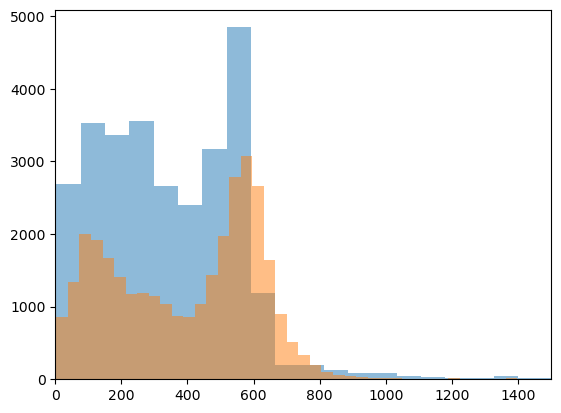

In [27]:
kwargs = dict(histtype='stepfilled', alpha=0.5, bins=200)

plt.hist(dfClusteringAll[dfClusteringAll['departureDuringRushHour'] == True]['serviceLifeTime'], **kwargs)
plt.hist(dfClusteringAll[dfClusteringAll['departureDuringRushHour'] == False]['serviceLifeTime'], **kwargs)
plt.xlim([0,1500])

(0.0, 800.0)

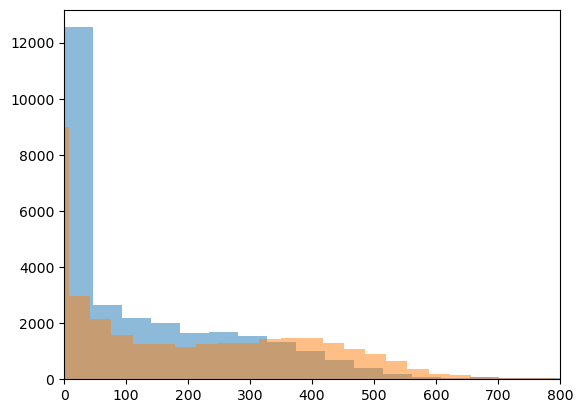

In [28]:
kwargs = dict(histtype='stepfilled', alpha=0.5, bins=200)

plt.hist(dfClusteringAll[dfClusteringAll['departureDuringRushHour'] == True]['blockingTime'], **kwargs)
plt.hist(dfClusteringAll[dfClusteringAll['departureDuringRushHour'] == False]['blockingTime'], **kwargs)
plt.xlim([0,800])

(0.0, 60.0)

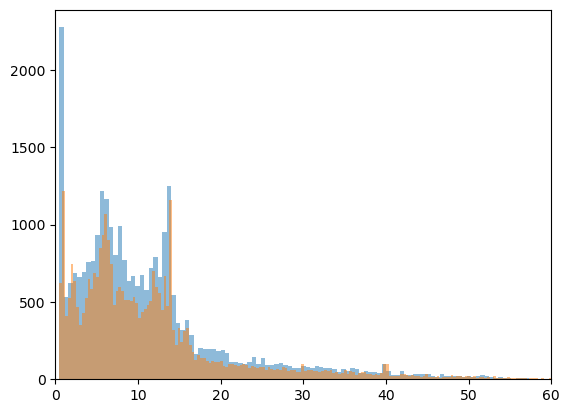

In [29]:
kwargs = dict(histtype='stepfilled', alpha=0.5, bins=200)

plt.hist(dfClusteringAll[dfClusteringAll['departureDuringRushHour'] == True]['kWhDelivered'], **kwargs)
plt.hist(dfClusteringAll[dfClusteringAll['departureDuringRushHour'] == False]['kWhDelivered'], **kwargs)
plt.xlim([0,60])

(0.0, 1500.0)

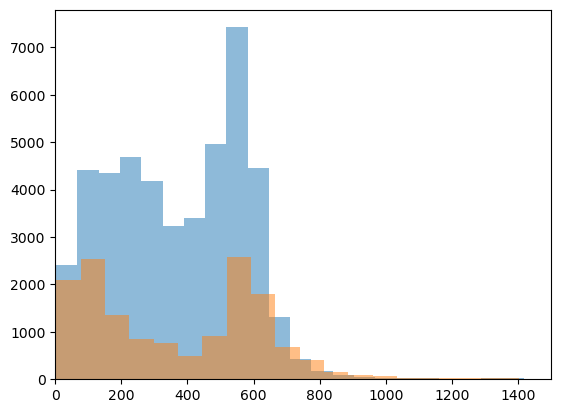

In [82]:
kwargs = dict(histtype='stepfilled', alpha=0.5, bins=200)

plt.hist(dfClusteringAll[dfClusteringAll['arrivalDuringRushHour'] == True]['serviceLifeTime'], **kwargs)
plt.hist(dfClusteringAll[dfClusteringAll['arrivalDuringRushHour'] == False]['serviceLifeTime'], **kwargs)
plt.xlim([0,1500])

(0.0, 800.0)

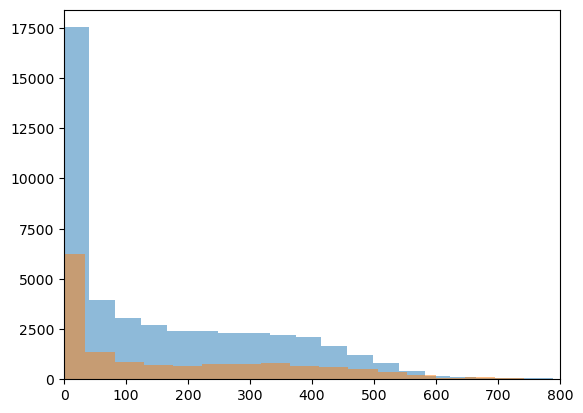

In [84]:
kwargs = dict(histtype='stepfilled', alpha=0.5, bins=200)

plt.hist(dfClusteringAll[dfClusteringAll['arrivalDuringRushHour'] == True]['blockingTime'], **kwargs)
plt.hist(dfClusteringAll[dfClusteringAll['arrivalDuringRushHour'] == False]['blockingTime'], **kwargs)
plt.xlim([0,800])

(0.0, 60.0)

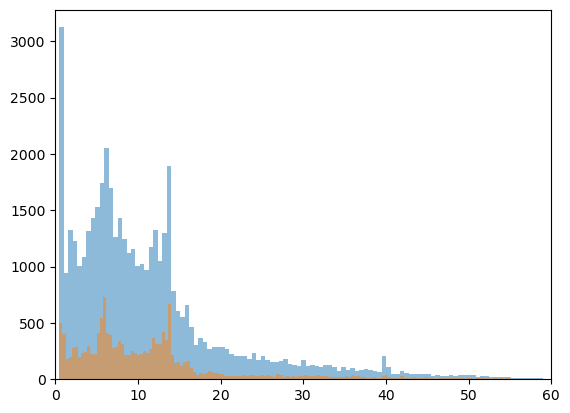

In [86]:
kwargs = dict(histtype='stepfilled', alpha=0.5, bins=200)

plt.hist(dfClusteringAll[dfClusteringAll['arrivalDuringRushHour'] == True]['kWhDelivered'], **kwargs)
plt.hist(dfClusteringAll[dfClusteringAll['arrivalDuringRushHour'] == False]['kWhDelivered'], **kwargs)
plt.xlim([0,60])

In [49]:
def plot_dependend_on_connectionMinute(dfClusteringAll, blnFeature):
    
    color = np.where(dfClusteringAll[blnFeature], 'green', 'red')
    
    plt.scatter(dfClusteringAll['connectionMinute'], dfClusteringAll['serviceLifeTime'], c=color)
    #plt.xlim(0,5000)
    #plt.ylim(0,5000)
    plt.show()
    
    plt.scatter(dfClusteringAll['connectionMinute'], dfClusteringAll['blockingTime'], c=color)
    #plt.xlim(0,2000)
    #plt.ylim(0,2000)
    plt.show()
    
    plt.scatter(dfClusteringAll['connectionMinute'], dfClusteringAll['kWhDelivered'], c=color)
    #plt.xlim(0,2000)
    #plt.ylim(0,2000)
    plt.show()

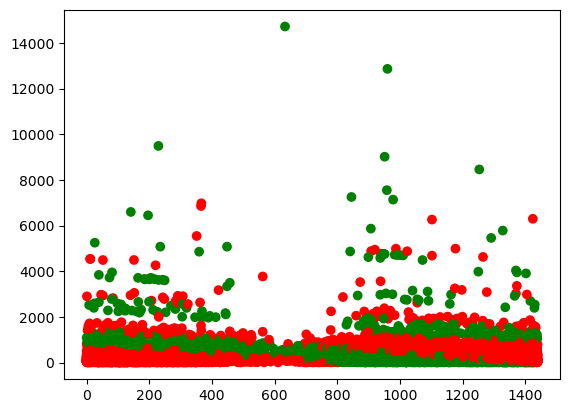

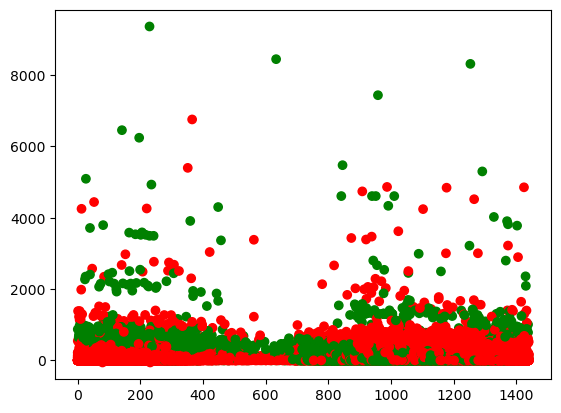

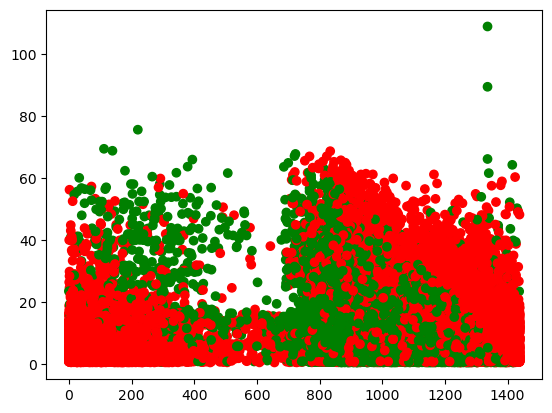

In [51]:
plot_dependend_on_connectionMinute(dfClusteringAll, 'departureDuringRushHour')

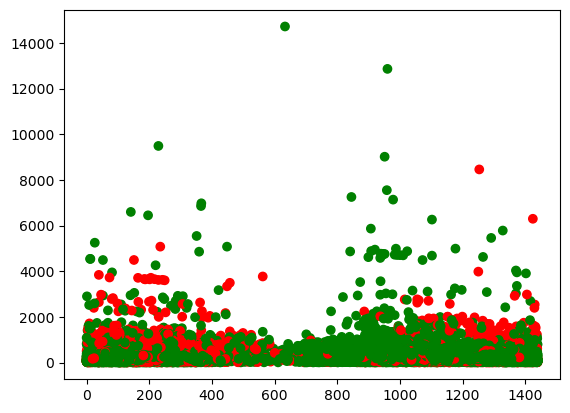

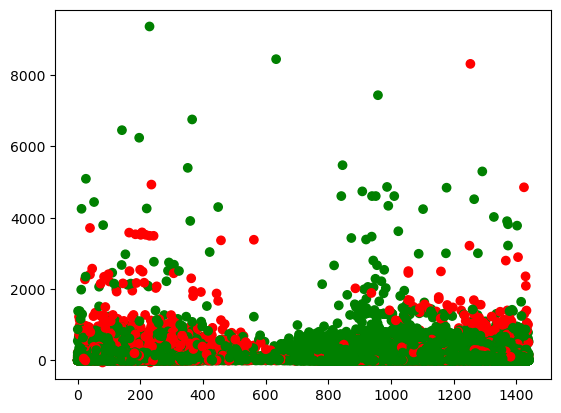

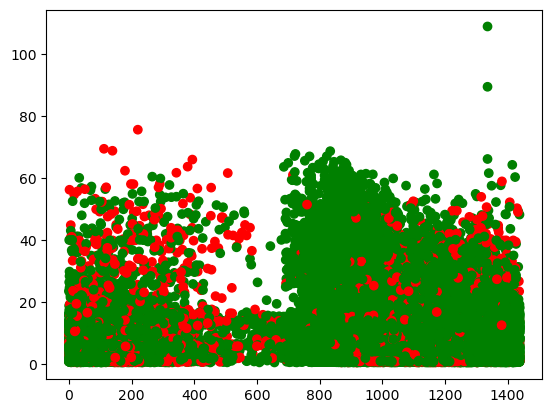

In [52]:
plot_dependend_on_connectionMinute(dfClusteringAll, 'arrivalOnWeekday')

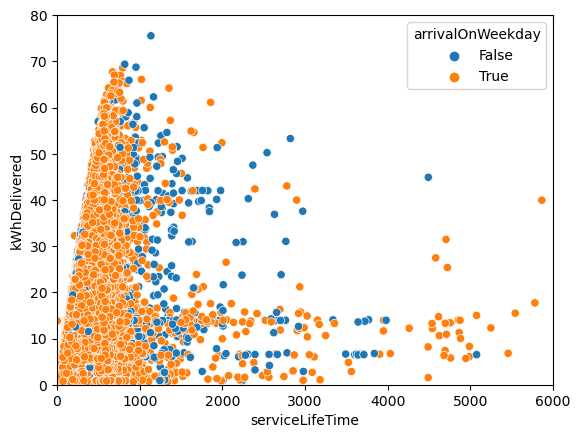

In [118]:
fig, ax = plt.subplots()
sns.scatterplot(x=dfClusteringAll['serviceLifeTime'], y=dfClusteringAll['kWhDelivered'], hue=dfClusteringAll['arrivalOnWeekday'], ax=ax)
ax.set_xlim(0, 6000)
ax.set_ylim(0, 80)
plt.show()

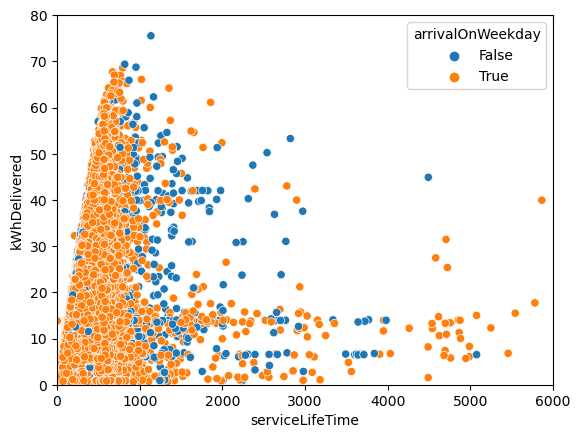

In [120]:
fig, ax = plt.subplots()
sns.scatterplot(x=dfClusteringAll['serviceLifeTime'], y=dfClusteringAll['kWhDelivered'], hue=dfClusteringAll['arrivalOnWeekday'], ax=ax)
ax.set_xlim(0, 6000)
ax.set_ylim(0, 80)
plt.show()

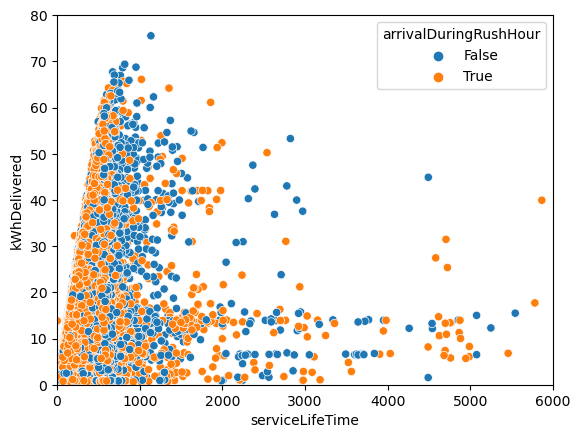

In [112]:
fig, ax = plt.subplots()
sns.scatterplot(x=dfClusteringAll['serviceLifeTime'], y=dfClusteringAll['kWhDelivered'], hue=dfClusteringAll['arrivalDuringRushHour'], ax=ax)
ax.set_xlim(0, 6000)
ax.set_ylim(0, 80)
plt.show()


In [297]:
dfClustering = dfClusteringAll.copy()

In [298]:
dfClustering = dfClustering.drop('connectionTime',axis=1)
dfClustering = dfClustering.drop('disconnectTime',axis=1)
dfClustering = dfClustering.drop('doneChargingTime',axis=1)
dfClustering = dfClustering.drop('connectionHour',axis=1)
dfClustering = dfClustering.drop('connectionMinute',axis=1)
dfClustering = dfClustering.drop('disconnectHour',axis=1)
dfClustering = dfClustering.drop('sessionID',axis=1)
dfClustering = dfClustering.drop('stationID',axis=1)
dfClustering = dfClustering.drop('arrivalDuringRushHour',axis=1)
dfClustering = dfClustering.drop('departureDuringRushHour',axis=1)
#dfClustering = dfClustering.drop('hasUserInputs',axis=1)

#dfClustering['hasUserInputs'] = dfClustering['hasUserInputs'].astype(int)
dfClustering['arrivalOnWeekday'] = dfClustering['arrivalOnWeekday'].astype(int)
#dfClustering['arrivalDuringRushHour'] = dfClustering['arrivalDuringRushHour'].astype(int)
#dfClustering['departureDuringRushHour'] = dfClustering['departureDuringRushHour'].astype(int)

In [299]:
#dfClustering['hasUserInputs'] = dfClustering['hasUserInputs'].astype(int)

In [300]:
dfClustering.head()

,kWhDelivered,siteID,arrivalOnWeekday,serviceLifeTime,blockingTime,arrivalBeforeNoon
0,25.016,1,1,362.350000,0.275056,False
1,33.097,1,1,541.516667,0.259026,False
2,6.521,1,1,642.783333,0.753390,False
3,2.355,1,1,158.683333,0.503519,False
4,13.375,1,1,488.650000,0.473072,False


In [223]:
dfClusteringAll[dfClusteringAll['siteID']==2]

,connectionTime,disconnectTime,doneChargingTime,kWhDelivered,sessionID,siteID,stationID,userInputs,connectionHour,disconnectHour,...,arrivalOnWeekday,serviceLifeTime,blockingTime,arrivalDuringRushHour,departureDuringRushHour,arrivalBeforeNoon,meanTemp,meanPrecip,meanCloudCover,meanWindspeed
20179,2019-01-01 17:41:45+00:00,2019-01-01 18:39:21+00:00,2019-01-01 18:40:21+00:00,0.900,2_39_138_566_2019-01-01 17:41:44.784919,2,2-39-138-566,NaN,18,19,...,True,57.600000,-0.017361,True,True,False,12.000000,0.0,34.0,20.000000
20180,2019-01-01 18:09:17+00:00,2019-01-02 02:39:32+00:00,2019-01-01 20:16:10+00:00,12.534,2_39_79_379_2019-01-01 18:09:16.991864,2,2-39-79-379,"[{'WhPerMile': 222, 'kWhRequested': 17.76, 'mi...",19,3,...,True,510.250000,0.751331,True,False,False,12.888889,0.0,33.0,25.222222
20181,2019-01-01 18:39:25+00:00,2019-01-01 19:18:49+00:00,2019-01-01 19:19:47+00:00,0.883,2_39_138_566_2019-01-01 18:39:24.566872,2,2-39-138-566,NaN,19,20,...,True,39.400000,-0.024535,True,True,False,12.000000,0.0,34.0,33.000000
20182,2019-01-01 19:18:53+00:00,2019-01-01 20:14:07+00:00,2019-01-01 19:59:08+00:00,0.879,2_39_138_566_2019-01-01 19:18:52.843645,2,2-39-138-566,NaN,20,21,...,True,55.233333,0.271273,True,True,False,13.000000,0.0,34.0,31.000000
20183,2019-01-01 21:05:57+00:00,2019-01-02 02:03:02+00:00,2019-01-02 01:59:27+00:00,16.136,2_39_79_378_2019-01-01 21:05:56.972890,2,2-39-79-378,"[{'WhPerMile': 400, 'kWhRequested': 20.0, 'mil...",22,3,...,True,297.083333,0.012062,True,False,False,13.000000,0.0,32.5,24.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51581,2020-12-30 19:32:38+00:00,2020-12-30 20:34:51+00:00,2020-12-30 20:34:46+00:00,3.068,2_39_125_21_2020-12-30 19:32:38.465177,2,2-39-125-21,"[{'WhPerMile': 350, 'kWhRequested': 35.0, 'mil...",20,21,...,True,62.216667,0.001339,True,True,False,17.000000,0.0,34.0,7.000000
51583,2020-12-30 23:02:11+00:00,2020-12-31 02:53:06+00:00,2020-12-31 00:08:50+00:00,2.244,2_39_78_365_2020-12-30 23:02:11.119521,2,2-39-78-365,"[{'WhPerMile': 290, 'kWhRequested': 5.8, 'mile...",0,3,...,True,230.916667,0.711368,True,False,True,15.750000,0.0,33.5,3.750000
51584,2020-12-31 16:17:43+00:00,2020-12-31 17:09:35+00:00,NaT,24.903,2_39_81_4550_2020-12-31 16:17:42.790605,2,2-39-81-4550,"[{'WhPerMile': 283, 'kWhRequested': 28.3, 'mil...",17,18,...,True,51.866667,NaN,True,True,False,9.000000,0.0,30.0,6.000000
51585,2020-12-31 16:45:14+00:00,2020-12-31 17:30:59+00:00,2020-12-31 17:30:54+00:00,5.289,2_39_127_19_2020-12-31 16:45:13.554563,2,2-39-127-19,"[{'WhPerMile': 283, 'kWhRequested': 28.3, 'mil...",17,18,...,True,45.750000,0.001821,True,True,False,11.000000,0.0,32.0,12.500000


In [234]:
X = dfClusteringAll.copy()

In [235]:
X = X.drop('connectionTime',axis=1)
X = X.drop('disconnectTime',axis=1)
X = X.drop('doneChargingTime',axis=1)
X = X.drop('sessionID',axis=1)
X = X.drop('stationID',axis=1)
X = X.drop('userInputs',axis=1)
X = X.drop('connectionHour',axis=1)
X = X.drop('disconnectHour',axis=1)
X = X.drop('connectionMinute',axis=1)
X = X.drop('blockingTime',axis=1)
X = X.drop('arrivalDuringRushHour',axis=1)
X = X.drop('departureDuringRushHour',axis=1)
X = X.drop('arrivalBeforeNoon',axis=1)

In [236]:
X = X.drop('siteID',axis=1)
#X = X.drop('hasUserInputs',axis=1)
X = X.drop('arrivalOnWeekday',axis=1)
#X = X.drop('arrivalBeforeNoon',axis=1)
#X = X.drop('departureDuringRushHour',axis=1)

In [237]:
X = X.drop('meanCloudCover',axis=1)

KeyError: "['meanCloudCover'] not found in axis"

In [238]:
X = X.drop('meanWindspeed',axis=1)

KeyError: "['meanWindspeed'] not found in axis"

In [239]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65037 entries, 0 to 65036
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   kWhDelivered     65037 non-null  float64
 1   serviceLifeTime  65037 non-null  float64
dtypes: float64(2)
memory usage: 1.5 MB


In [303]:
X = X.drop('nine',axis=1)

KeyError: "['nine'] not found in axis"

In [115]:
bckUp=X.copy()

In [216]:
bckUp

,kWhDelivered,serviceLifeTime,meanTemp,meanPrecip
0,25.016,362.350000,14.166667,0.0
1,33.097,541.516667,15.777778,0.0
2,6.521,642.783333,16.400000,0.0
3,2.355,158.683333,15.000000,0.0
4,13.375,488.650000,16.125000,0.0
...,...,...,...,...
65032,8.399,228.100000,29.500000,0.0
65033,16.864,161.050000,29.500000,0.0
65034,18.335,176.483333,29.000000,0.0
65035,22.815,219.866667,28.250000,0.0


In [187]:
X = bckUp.copy()

In [188]:
X = X.drop('meanTemp',axis=1)

In [189]:
X.head()

,kWhDelivered,serviceLifeTime,meanPrecip
0,25.016,362.350000,0.0
1,33.097,541.516667,0.0
2,6.521,642.783333,0.0
3,2.355,158.683333,0.0
4,13.375,488.650000,0.0


In [240]:
# exclude outliers
#X = X[(X['kWhDelivered'] >= 0) & (X['kWhDelivered'] < 70) & (X['serviceLifeTime'] >= 0) & (X['serviceLifeTime'] < 6000)]
X = X[(X['kWhDelivered'] >= 0) & (X['kWhDelivered'] < 70)]
X = X[(X['serviceLifeTime'] >= 0) & (X['serviceLifeTime'] < 8000)]


In [241]:
X[(X['serviceLifeTime'] >= 0) & (X['serviceLifeTime'] < 8000)].max()

kWhDelivered         69.74
serviceLifeTime    7548.65
dtype: float64

In [192]:
X['serviceLifeTime'].max()

7548.65

In [232]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54815 entries, 0 to 65036
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   kWhDelivered     54815 non-null  float64
 1   serviceLifeTime  54815 non-null  float64
dtypes: float64(2)
memory usage: 1.3 MB


In [231]:
X = X.drop('nine',axis=1)
X = X.drop('meanPrecip',axis=1)

In [242]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
X_scaled_df.head()

,kWhDelivered,serviceLifeTime
0,1.295652,-0.048051
1,2.083596,0.597350
2,-0.507715,0.962137
3,-0.913924,-0.781707
4,0.160589,0.406912


In [243]:
X_scaled

array([[ 1.29565219, -0.04805084],
       [ 2.08359558,  0.59735047],
       [-0.50771534,  0.96213729],
       ...,
       [ 0.64421675, -0.71758716],
       [ 1.08104219, -0.56130999],
       [-0.14499422, -0.79593588]])

In [244]:
from sklearn.cluster import KMeans

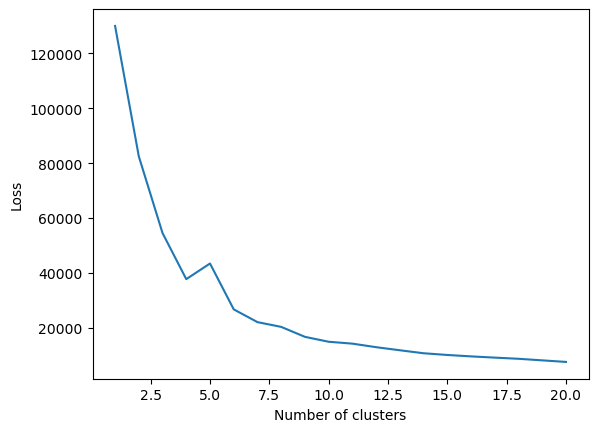

In [245]:
k_max = 20  # We have c. 150 datapoints, more than 50 clusters are definitely
            # not reasonable!

clusters = []
losses = []

for k in range(k_max):
    model = KMeans(n_clusters=k+1, n_init='auto')
    model.fit(X_scaled)
    clusters.append(k+1)
    losses.append(model.inertia_)



plt.plot(clusters, losses)
plt.ylabel("Loss")
plt.xlabel("Number of clusters")
plt.show()

(0.0, 15.0)

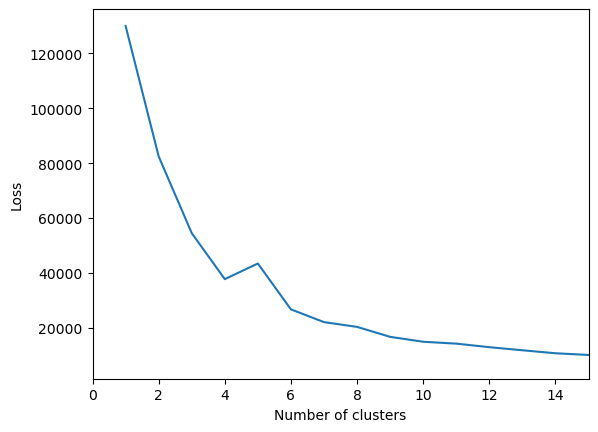

In [246]:
plt.plot(clusters, losses)
plt.ylabel("Loss")
plt.xlabel("Number of clusters")
plt.xlim([0,15])

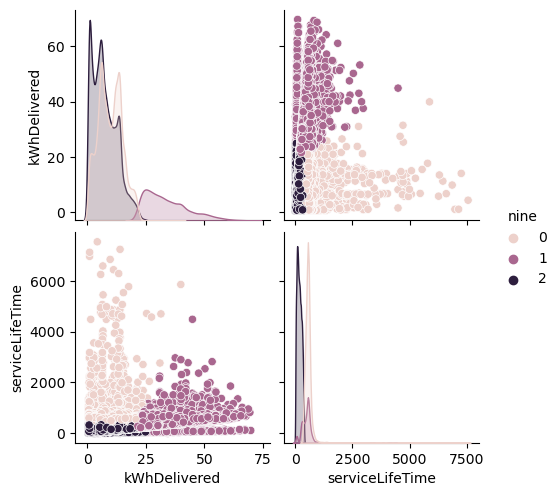

In [247]:
# refit algorithm
nine_means = KMeans(n_clusters=3, n_init='auto')
nine_means.fit(X_scaled)

# match records to clusters by calling predict
nine_means.predict(X_scaled)

X['nine'] = nine_means.predict(X_scaled)

sns.pairplot(data=X, hue="nine")

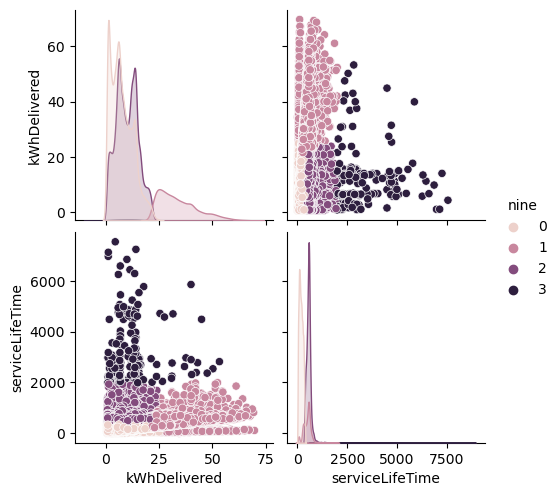

In [248]:
# refit algorithm
nine_means = KMeans(n_clusters=4, n_init='auto')
nine_means.fit(X_scaled)

# match records to clusters by calling predict
nine_means.predict(X_scaled)

X['nine'] = nine_means.predict(X_scaled)

sns.pairplot(data=X, hue="nine")

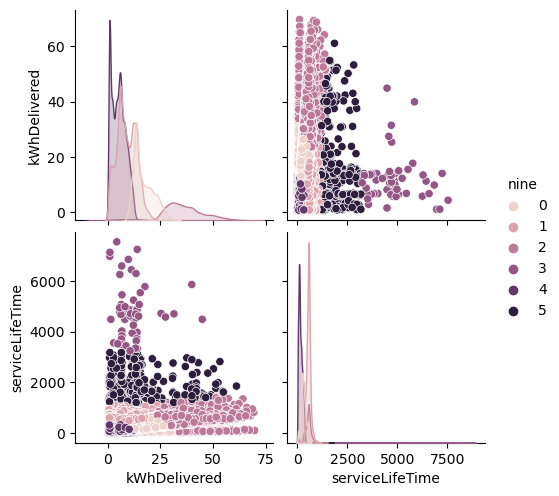

In [251]:
# refit algorithm
nine_means = KMeans(n_clusters=6, n_init='auto')
nine_means.fit(X_scaled)

# match records to clusters by calling predict
nine_means.predict(X_scaled)

X['nine'] = nine_means.predict(X_scaled)

sns.pairplot(data=X, hue="nine")

In [199]:
# refit algorithm
nine_means = KMeans(n_clusters=3, n_init='auto')
nine_means.fit(X_scaled)

# match records to clusters by calling predict
nine_means.predict(X_scaled)

X['nine'] = nine_means.predict(X_scaled)

sns.pairplot(data=X, hue="nine")

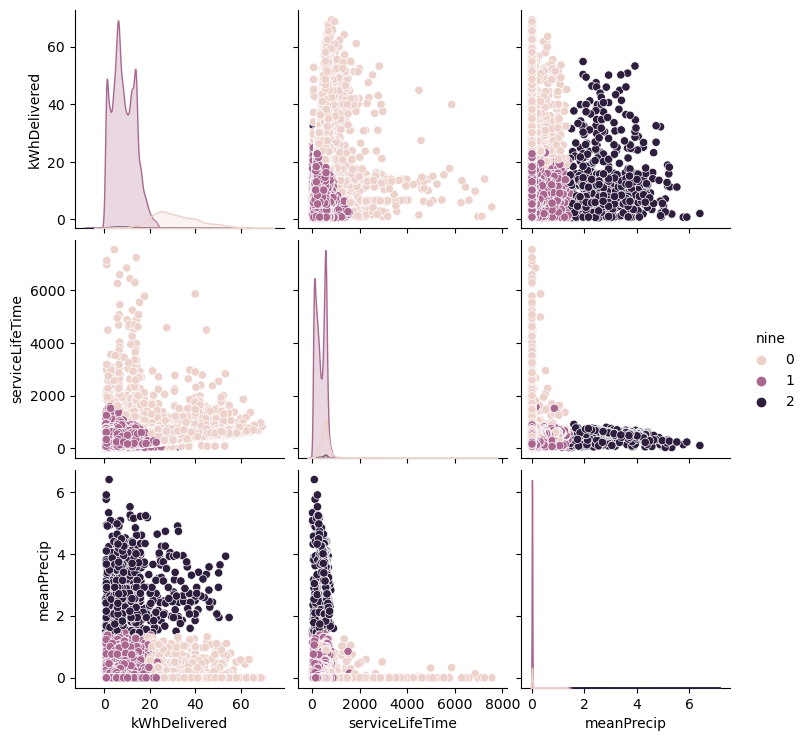

In [200]:
# refit algorithm
nine_means = KMeans(n_clusters=3, n_init='auto')
nine_means.fit(X_scaled)

# match records to clusters by calling predict
nine_means.predict(X_scaled)

X['nine'] = nine_means.predict(X_scaled)

sns.pairplot(data=X, hue="nine")

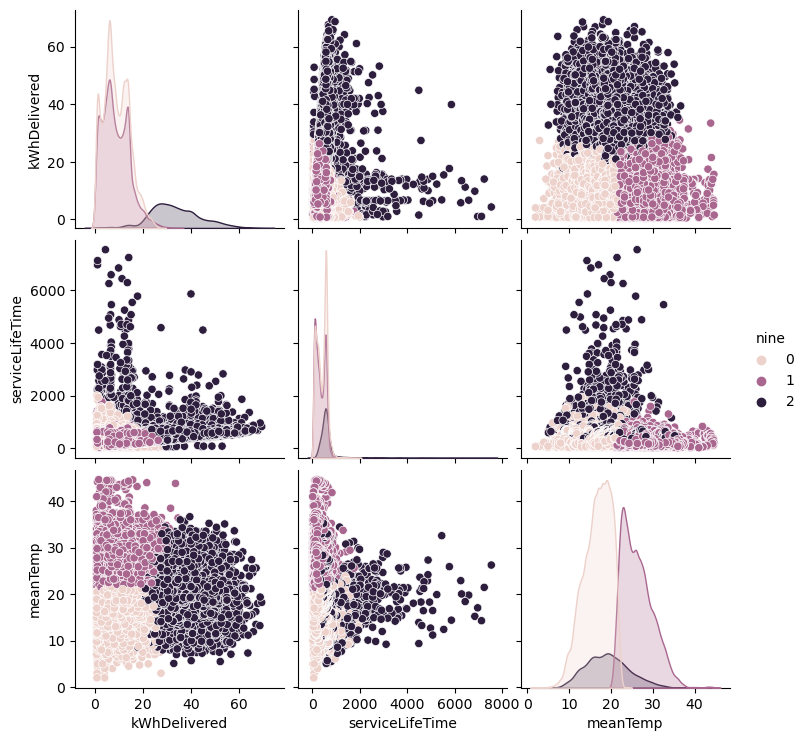

In [184]:
sns.pairplot(data=X, hue="nine")

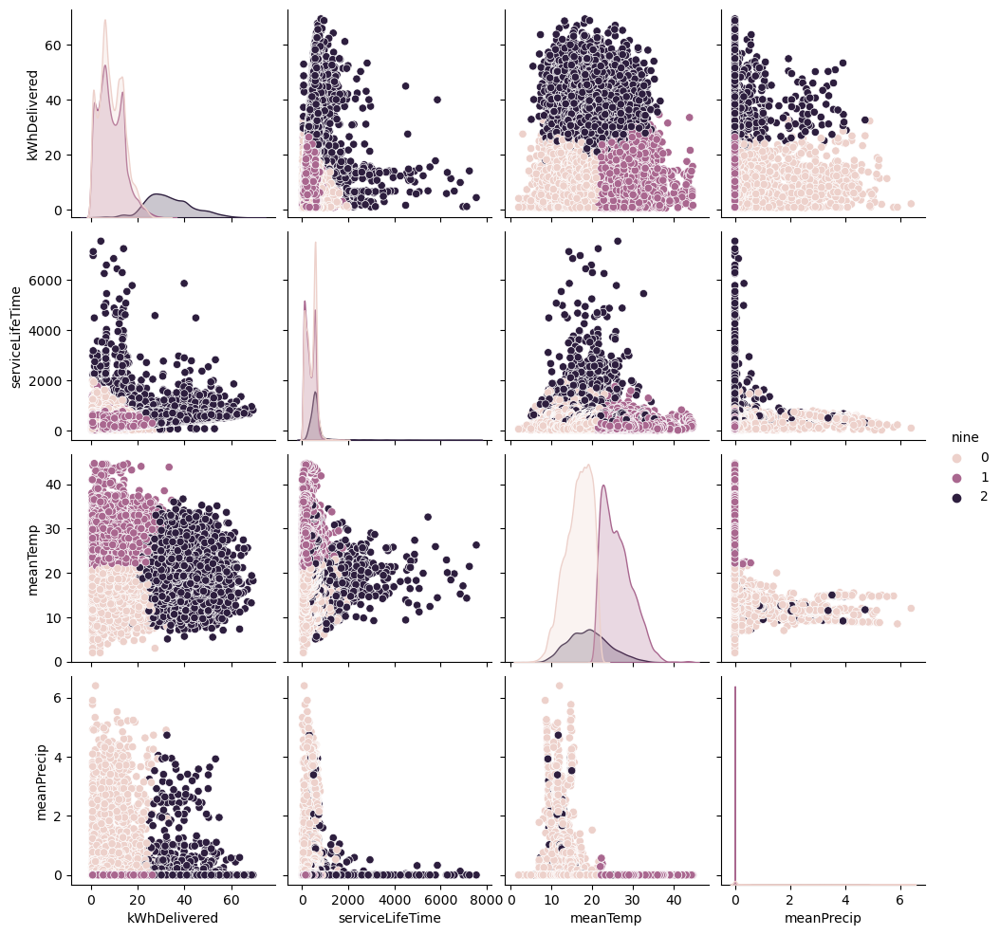

In [165]:
sns.pairplot(data=X, hue="nine")

In [166]:
print(len(X[X['nine']==0]))
print(len(X[X['nine']==1]))
print(len(X[X['nine']==2]))
print(len(X[X['nine']==3]))
print(len(X[X['nine']==4]))

26203
22071
6541
0
0


In [201]:
# refit algorithm
nine_means = KMeans(n_clusters=4, n_init='auto')
nine_means.fit(X_scaled)

# match records to clusters by calling predict
nine_means.predict(X_scaled)

X['nine'] = nine_means.predict(X_scaled)

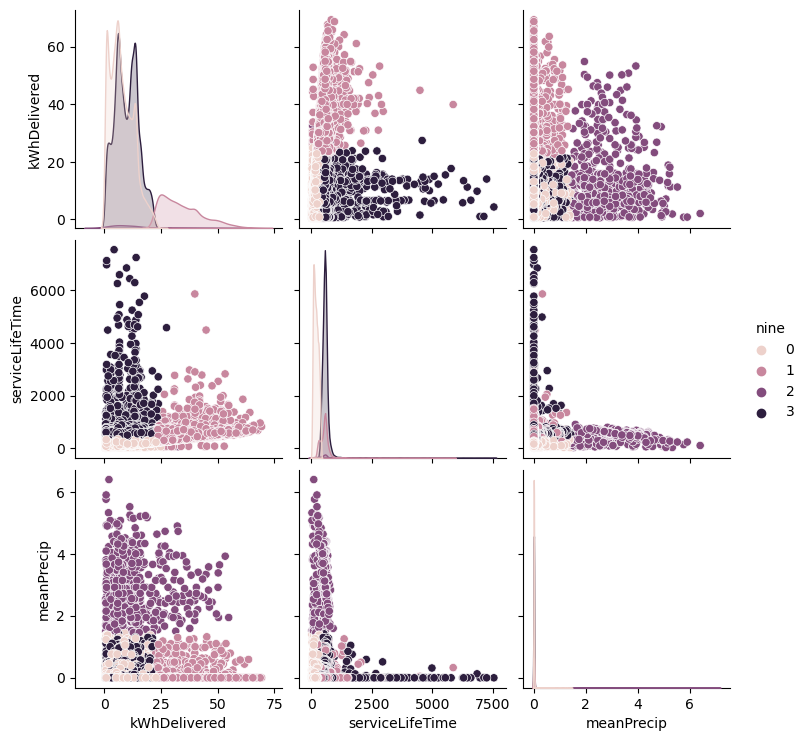

In [202]:
sns.pairplot(data=X, hue="nine")

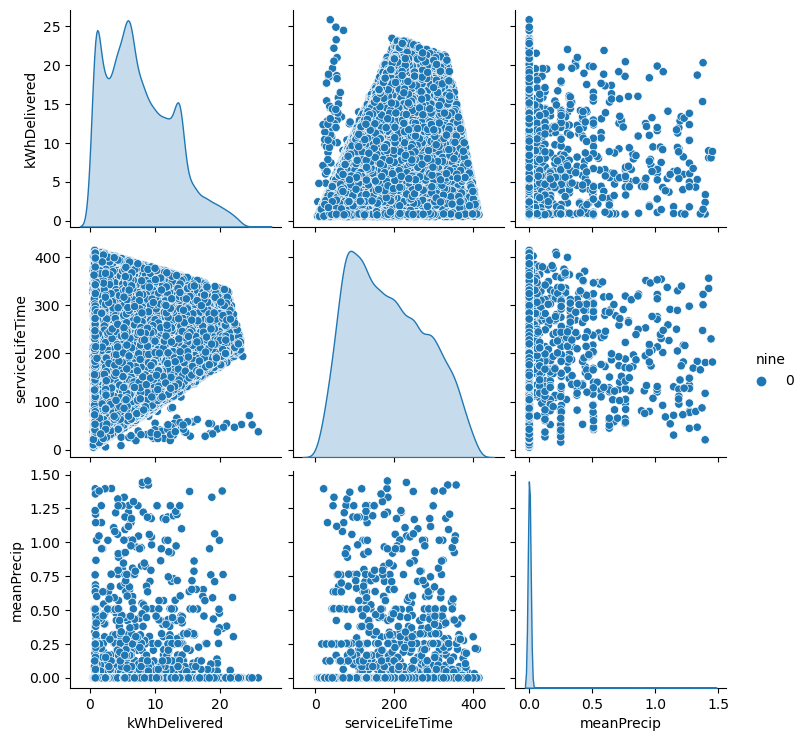

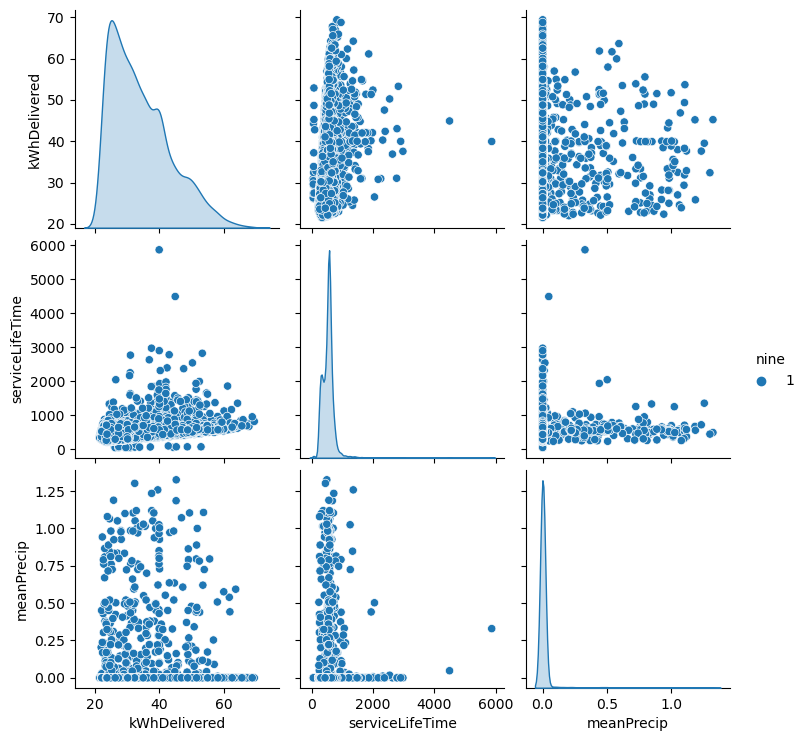

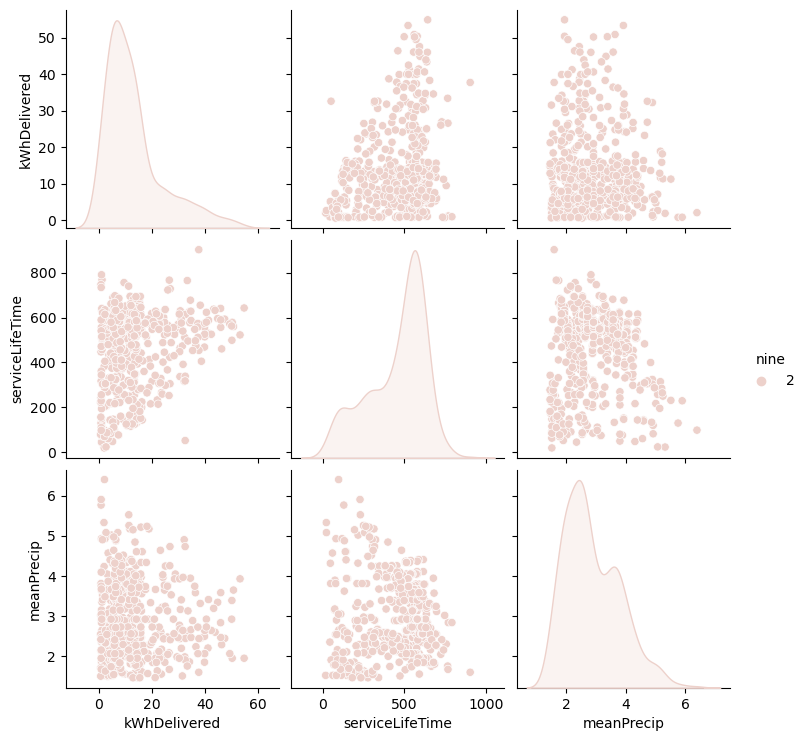

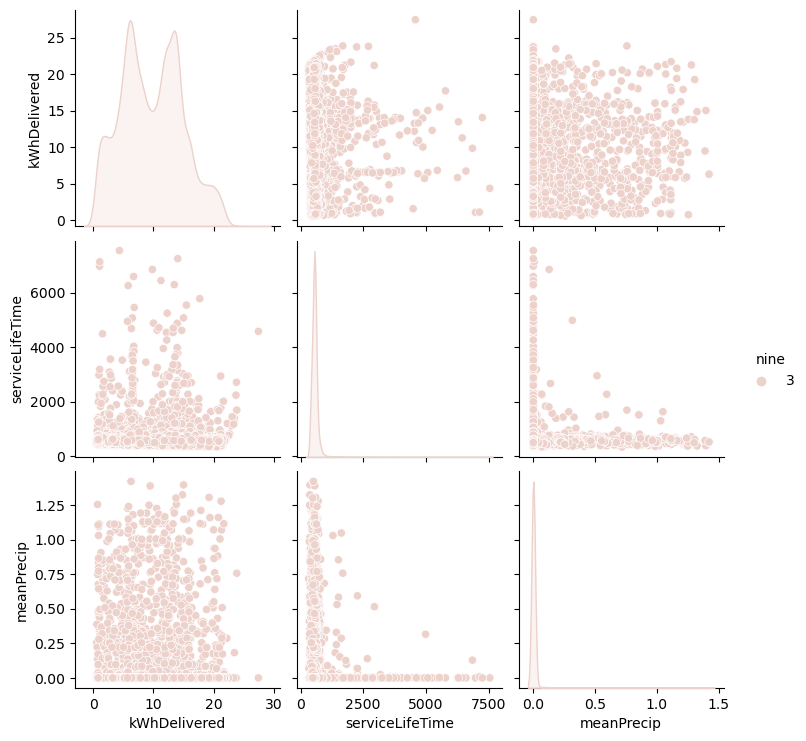

In [212]:
for i in range(0,4):
    sns.pairplot(data=X[(X['nine']==i)], hue="nine")

In [204]:
print(X[X['nine']==0]['serviceLifeTime'].mean())
print(X[X['nine']==0]['serviceLifeTime'].min())
print(X[X['nine']==0]['serviceLifeTime'].max())

184.42969186529854
5.35
413.8833333333333


In [205]:
print(X[X['nine']==1]['serviceLifeTime'].mean())
print(X[X['nine']==1]['serviceLifeTime'].min())
print(X[X['nine']==1]['serviceLifeTime'].max())

527.3436293436273
43.06666666666667
5864.433333333333


In [203]:
print(X[X['nine']==2]['serviceLifeTime'].mean())
print(X[X['nine']==2]['serviceLifeTime'].min())
print(X[X['nine']==2]['serviceLifeTime'].max())


453.46098003629817
19.183333333333334
902.1


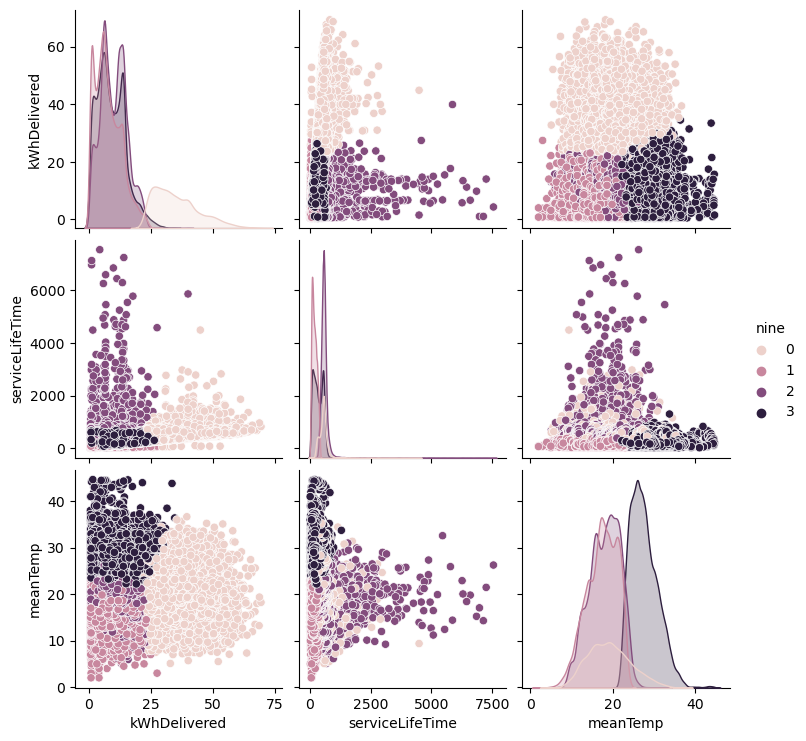

In [186]:
sns.pairplot(data=X, hue="nine")

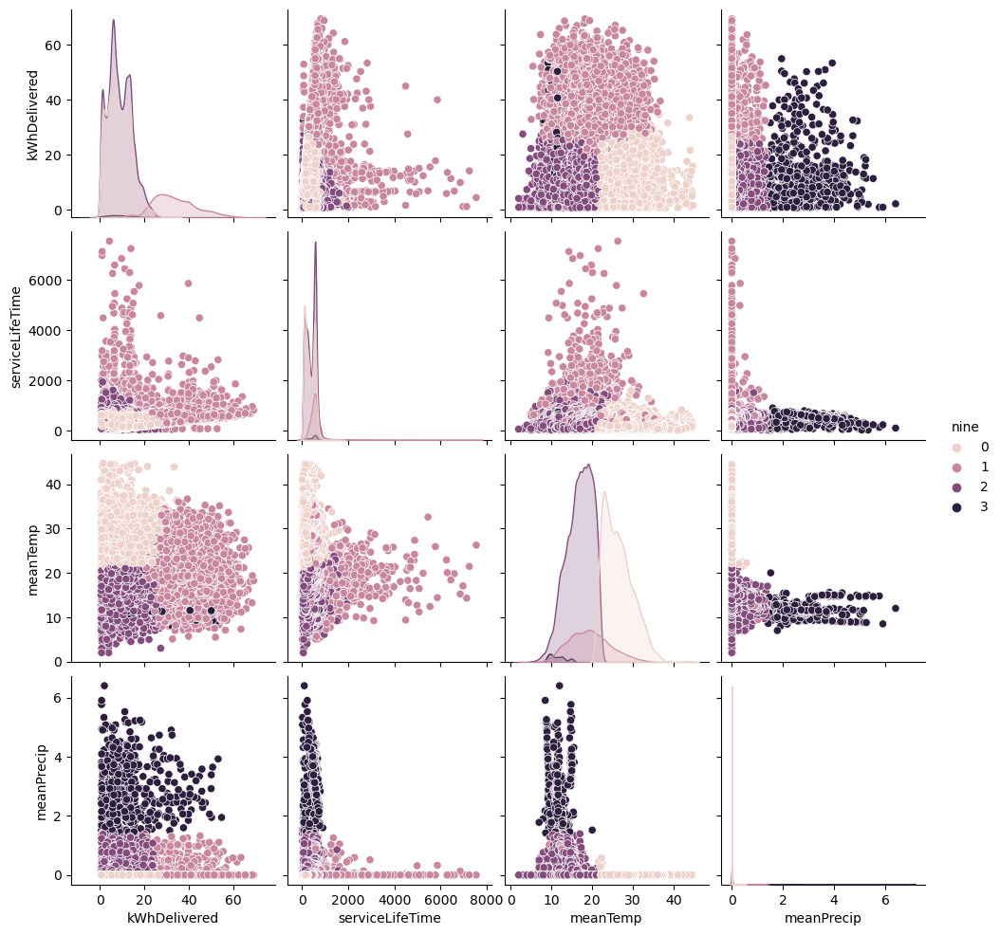

In [171]:
sns.pairplot(data=X, hue="nine")

In [172]:
print(len(X[X['nine']==0]))
print(len(X[X['nine']==1]))
print(len(X[X['nine']==2]))
print(len(X[X['nine']==3]))
print(len(X[X['nine']==4]))

21042
6464
26755
554
0


#### only kWhDeliv und ServiceLifeTime

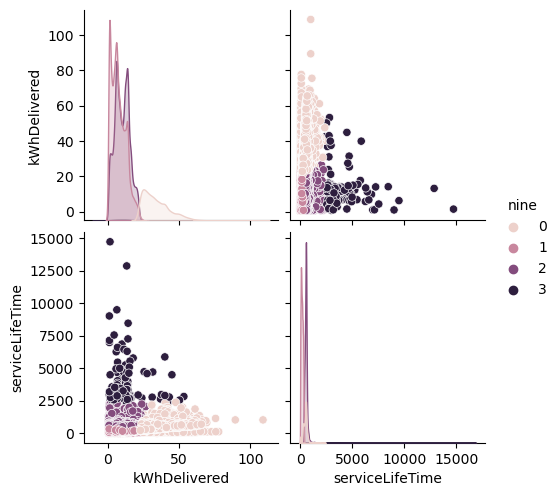

In [316]:
sns.pairplot(data=X, hue="nine")

In [317]:
print(len(X[X['nine']==0]))
print(len(X[X['nine']==1]))
print(len(X[X['nine']==2]))
print(len(X[X['nine']==3]))
print(len(X[X['nine']==4]))

8279
29553
27076
129
0


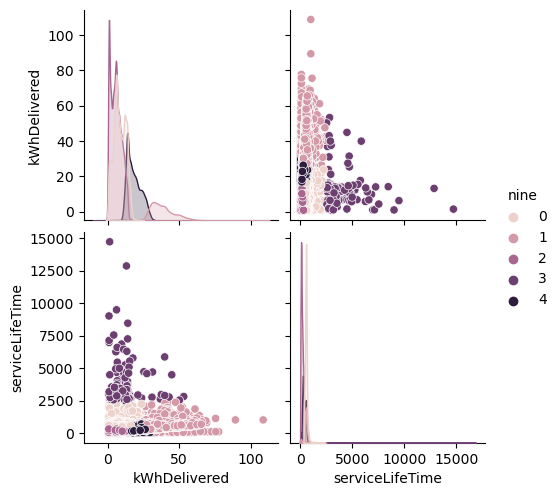

In [320]:
sns.pairplot(data=X, hue="nine")

In [321]:
print(len(X[X['nine']==0]))
print(len(X[X['nine']==1]))
print(len(X[X['nine']==2]))
print(len(X[X['nine']==3]))
print(len(X[X['nine']==4]))

22449
5298
24788
127
12375


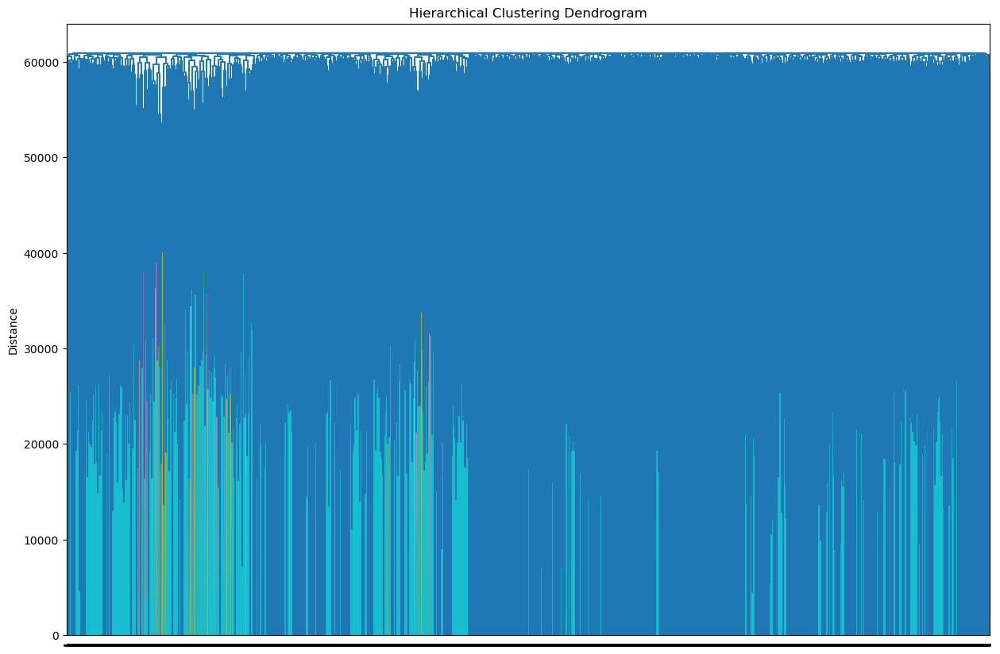

In [77]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz 
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

def plot_dendrogram(model, **kwargs):

    # Children of hierarchical clustering
    children = model.children_

    # Distances between each pair of children
    # Since we don't have this information, we can use a uniform one for plotting
    distance = np.arange(children.shape[0])

    # The number of observations contained in each cluster level
    no_of_observations = np.arange(2, children.shape[0]+2)

    # Create linkage matrix and then plot the dendrogram
    linkage_matrix = np.column_stack([children, distance, no_of_observations]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


agglo = AgglomerativeClustering(n_clusters=4) #The number of clusters to find
y_pred_agglo = agglo.fit_predict(X_scaled)

plt.figure(figsize=(15,10))
plt.title('Hierarchical Clustering Dendrogram')
plot_dendrogram(agglo, labels=agglo.labels_)
plt.ylabel("Distance")
plt.show()



### Include weather data

In [3]:
#Load the weather data from burbank airport
dfWeather = pd.read_csv("Data/weather_burbank_airport.csv")
dfWeather.head()

,city,timestamp,temperature,cloud_cover,cloud_cover_description,pressure,windspeed,precipitation,felt_temperature
0,Burbank,2018-01-01 08:53:00,9.0,33.0,Fair,991.75,9.0,0.0,8.0
1,Burbank,2018-01-01 09:53:00,9.0,33.0,Fair,992.08,0.0,0.0,9.0
2,Burbank,2018-01-01 10:53:00,9.0,21.0,Haze,992.08,0.0,0.0,9.0
3,Burbank,2018-01-01 11:53:00,9.0,29.0,Partly Cloudy,992.08,0.0,0.0,9.0
4,Burbank,2018-01-01 12:53:00,8.0,33.0,Fair,992.08,0.0,0.0,8.0


In [4]:
# Sort the DataFrame by timestamp
dfWeather.sort_values(by='timestamp', inplace=True)

# Function to impute missing values using the mean of neighboring values
def impute_missing_values(column, window_size=5):
    # Calculate the mean using a rolling window
    # We have to use a window for the cases where some neighboring values are also missing.
    return column.fillna(column.rolling(window=window_size, min_periods=1).mean())

# Apply the imputation function to the specified columns
columns_to_impute = ['temperature', 'cloud_cover', 'windspeed', 'pressure',"felt_temperature"]

for column in columns_to_impute:
    dfWeather[column] = impute_missing_values(dfWeather[column])

# Verify the changes
print(dfWeather.isnull().sum())

city                        0
timestamp                   0
temperature                 0
cloud_cover                 0
cloud_cover_description    20
pressure                    0
windspeed                   0
precipitation               0
felt_temperature            0
dtype: int64


In [43]:
dfWeather['timestamp'] =pd.to_datetime(dfWeather['timestamp'],utc = True)

In [104]:
def get_mean_temperature(entry):
    
    series = dfWeather[(dfWeather['timestamp'] >= entry['connectionTime']) & (dfWeather['timestamp'] <= entry['disconnectTime'])]

    return series['temperature'].mean(), series['precipitation'].mean(), series['cloud_cover'].mean(), series['windspeed'].mean()

#dfClusteringAll['meanTemp'], dfClusteringAll['meanPrecip'], dfClusteringAll['meanCloudCover'], dfClusteringAll['meanWindspeed'] = 
#print(dfClusteringAll.iloc[0:10].apply(lambda row: get_mean_temperature(row), axis=1))
dfClusteringAll = pd.concat([dfClusteringAll, pd.DataFrame((dfClusteringAll.apply(lambda row: get_mean_temperature(row), axis=1).to_list()), columns=['meanTemp','meanPrecip','meanCloudCover','meanWindspeed'])], axis=1)

print(dfClusteringAll.head())

             connectionTime            disconnectTime  \
0 2020-01-02 13:08:54+00:00 2020-01-02 19:11:15+00:00   
1 2020-01-02 13:36:50+00:00 2020-01-02 22:38:21+00:00   
2 2020-01-02 13:56:35+00:00 2020-01-03 00:39:22+00:00   
3 2020-01-02 13:59:58+00:00 2020-01-02 16:38:39+00:00   
4 2020-01-02 14:00:01+00:00 2020-01-02 22:08:40+00:00   

           doneChargingTime  kWhDelivered  \
0 2020-01-02 17:31:35+00:00        25.016   
1 2020-01-02 20:18:05+00:00        33.097   
2 2020-01-02 16:35:06+00:00         6.521   
3 2020-01-02 15:18:45+00:00         2.355   
4 2020-01-02 18:17:30+00:00        13.375   

                                sessionID  siteID    stationID  \
0  1_1_179_810_2020-01-02 13:08:53.870034       1  1-1-179-810   
1  1_1_193_825_2020-01-02 13:36:49.599853       1  1-1-193-825   
2  1_1_193_829_2020-01-02 13:56:35.214993       1  1-1-193-829   
3  1_1_193_820_2020-01-02 13:59:58.309319       1  1-1-193-820   
4  1_1_193_819_2020-01-02 14:00:00.779967       1  1-1-1

In [105]:
dfClusteringAll = dfClusteringAll[dfClusteringAll['meanTemp'].notnull()]

In [106]:
dfClusteringAll.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54821 entries, 0 to 65036
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype              
---  ------                   --------------  -----              
 0   connectionTime           54821 non-null  datetime64[ns, UTC]
 1   disconnectTime           54821 non-null  datetime64[ns, UTC]
 2   doneChargingTime         52282 non-null  datetime64[ns, UTC]
 3   kWhDelivered             54821 non-null  float64            
 4   sessionID                54821 non-null  object             
 5   siteID                   54821 non-null  int64              
 6   stationID                54821 non-null  object             
 7   userInputs               38879 non-null  object             
 8   connectionHour           54821 non-null  int64              
 9   disconnectHour           54821 non-null  int64              
 10  connectionMinute         54821 non-null  int64              
 11  arrivalOnWeekday         548

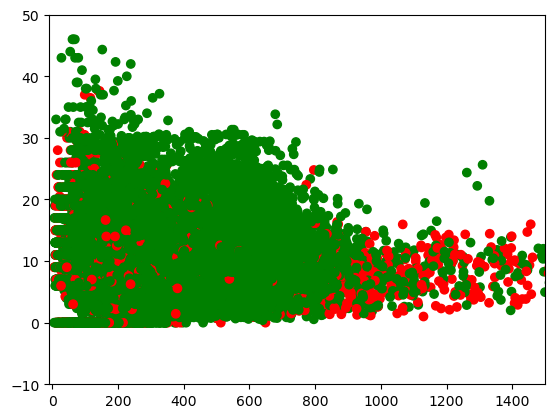

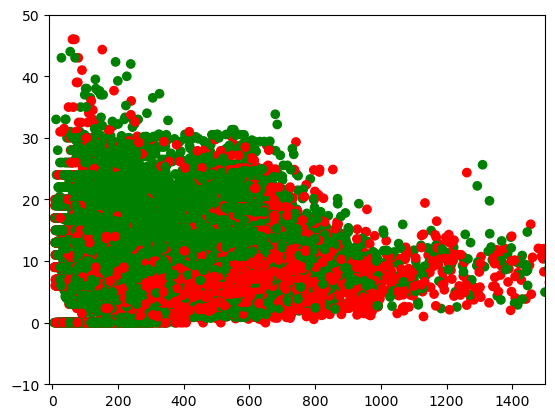

In [96]:
plot_relationships('serviceLifeTime','meanWindspeed',-10,1500,-10,50)

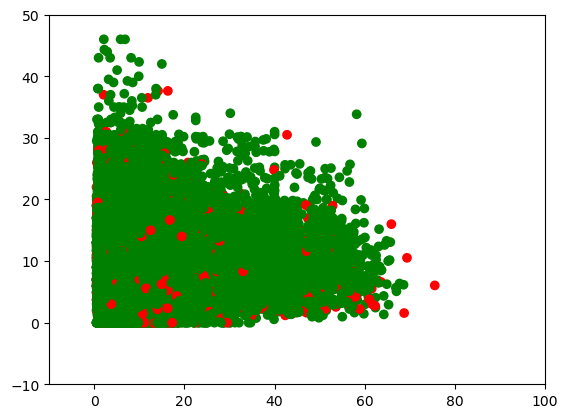

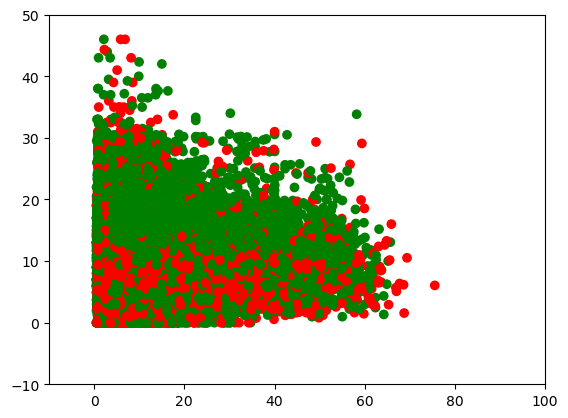

In [94]:
plot_relationships('kWhDelivered','meanWindspeed',-10,100,-10,50)

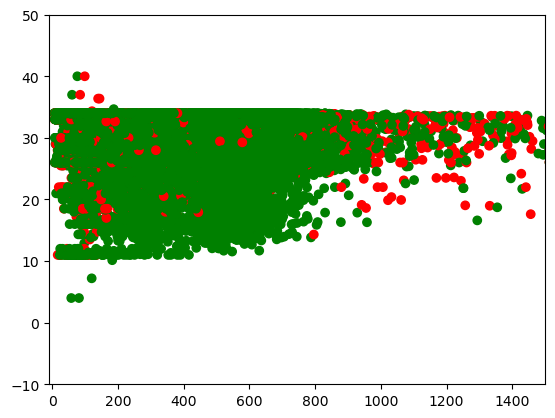

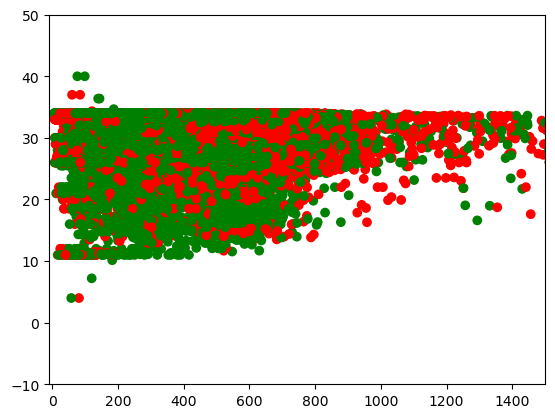

In [91]:
plot_relationships('serviceLifeTime','meanCloudCover',-10,1500,-10,50)

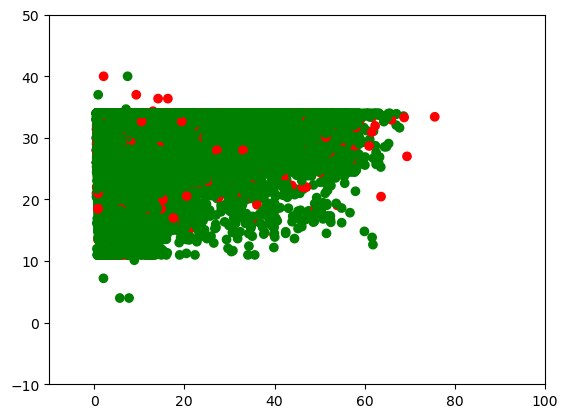

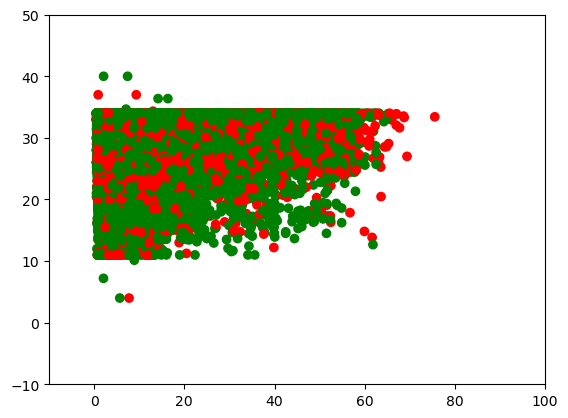

In [92]:
plot_relationships('kWhDelivered','meanCloudCover',-10,100,-10,50)

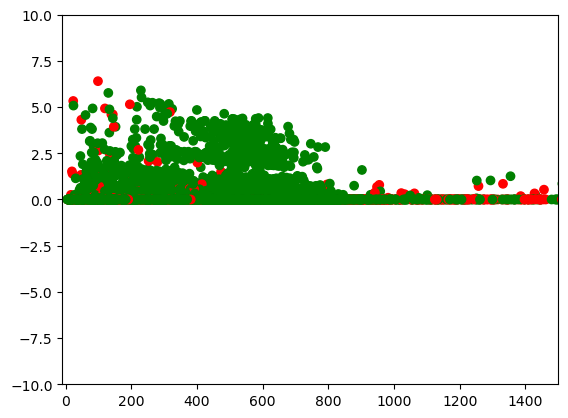

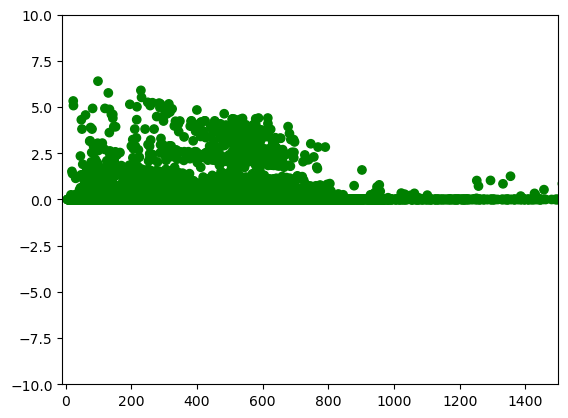

In [218]:
plot_relationships('serviceLifeTime','meanPrecip',-10,1500,-10,10)

In [ ]:
dfClusteringAll

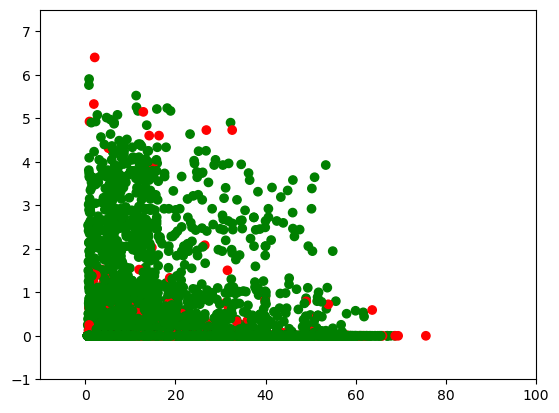

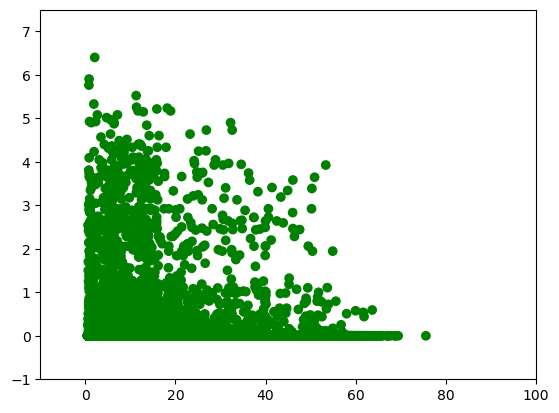

In [214]:
plot_relationships('kWhDelivered','meanPrecip',-10,100,-1,7.5)

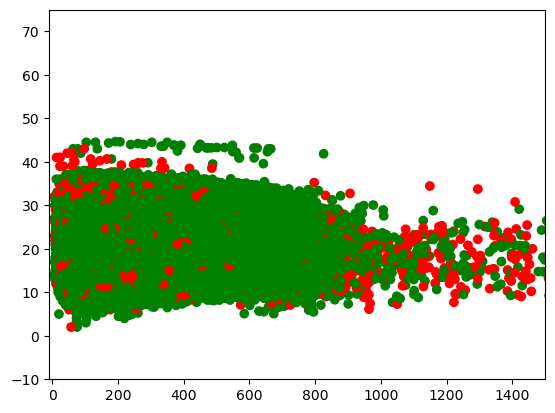

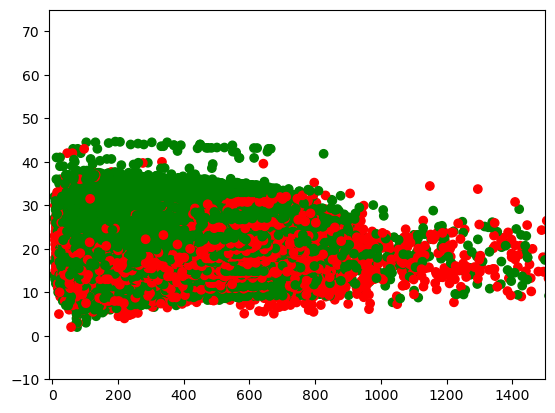

In [81]:
plot_relationships('serviceLifeTime','meanTemp',-10,1500,-10,75)

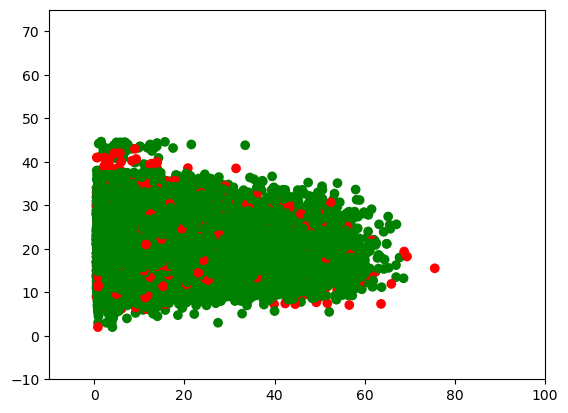

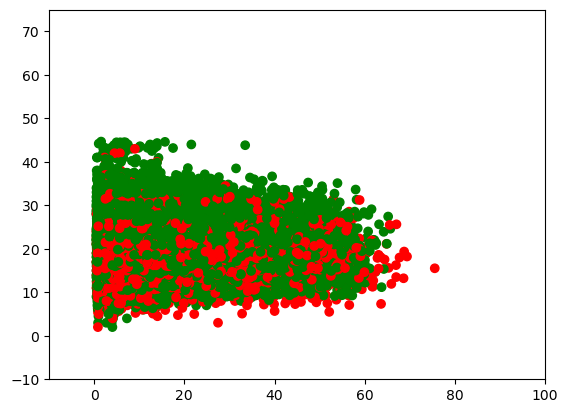

In [83]:
plot_relationships('kWhDelivered','meanTemp',-10,100,-10,75)